# Tutorial: Generating substrate specific thiolases with PoET <a class="anchor" id="first"></a>





This tutorial will introduce OpenProtein's new PoET workflow, a cutting-edge protein language model designed to facilitate evaluating protein sequences from scratch, eliminating the need for functional measurements of your specific protein. With this model, you can effortlessly score candidate proteins, or generate a custom diverse library  before running any wetlab experiments!

The OP models in PoET is governed by a prompt, which consists of a collection of sequences that encode valuable insights into the local fitness landscape and co-evolutionary patterns associated with your protein of interest. One effective approach for constructing this prompt involves, first; generating a multiple sequence alignment (MSA) of your protein with sequences from various evolutionary lineages, and second; applying filters to that MSA to create a focussed prompt. Since these sequences share an evolutionary connection, they inherently carry information about the protein's local fitness landscape. PoET leverages this information to both:

1. assess the probability of observing a specific sequence based on the inferred evolutionary process
2. generate novel sequences based on the same inferred evolutionary landscape.

We will apply this new machine learning model to develop novel thiolase enzymes with activity against a compound of interest. 




## Thiolase superfamily <a class="anchor" id="1_0"></a>

Thiolases play a critical role in catalyzing thioester formation — a key process in fatty acid biosynthesis *in vivo*. Thiolases have attracted significant research interest due to their role in catalysing thioester formation, which is a key intermediary in several industrial processes, including:

- Pharmaceuticals: thioesters can be extensively modified with specific moieties, enabling the synthesis of a wide range of pharmaceuticals with desired properties
- Biopolymers: thiolases enable the efficient conversion of organic acids into thioesters, which are subsequently polymerized to create environmentally friendly biopolymers. For example polyhydroxyalkanoate (PHA). 
- Flavours and fragrences: thioesters are key components in the synthesis of aroma compounds and flavour enhancers

Understanding the factors that govern thiolase substrate specificity is therefore crucial. Furthermore, developing novel thiolases with improved specificity or activity may yield novel products or more efficient industrial processes. 

This tutorial will build on the work and data made available by [Robinson (2020)](https://academic.oup.com/synbio/article/5/1/ysaa004/5847618){target="_blank"}. Robinson et al. investigated thiolase substrate specificity and activity with an extensive library of compounds and thiolases.

We will demonstrate how OpenProtein's PoET model can leverage co-evolutionary data from an MSA to score sequences, generate new candidate sequences *de novo*, and facilitate further *in-vitro* testing. Our workflow will begin with a single seed sequence obtained freely from Uniprot, while the Robinson dataset will tie our observations back to experimental data, and provide an empirical validation of the trends we see in our modelling. 



### Activity and specificity dataset <a class="anchor" id="1_1"></a>

I have reproduced [ figure 2](https://academic.oup.com/view-large/figure/206116503/ysaa004f2.tif){target="_blank"} from the Robinson paper as a visual summary of the dataset; we have 15 chemical compounds of various chemical structures, and 73 thiolases from a broad range of taxonomic classes. We can note that most thiolases show activity against only a subset of compounds, and activity is highly variable (~1-3 orders of magnitude difference).

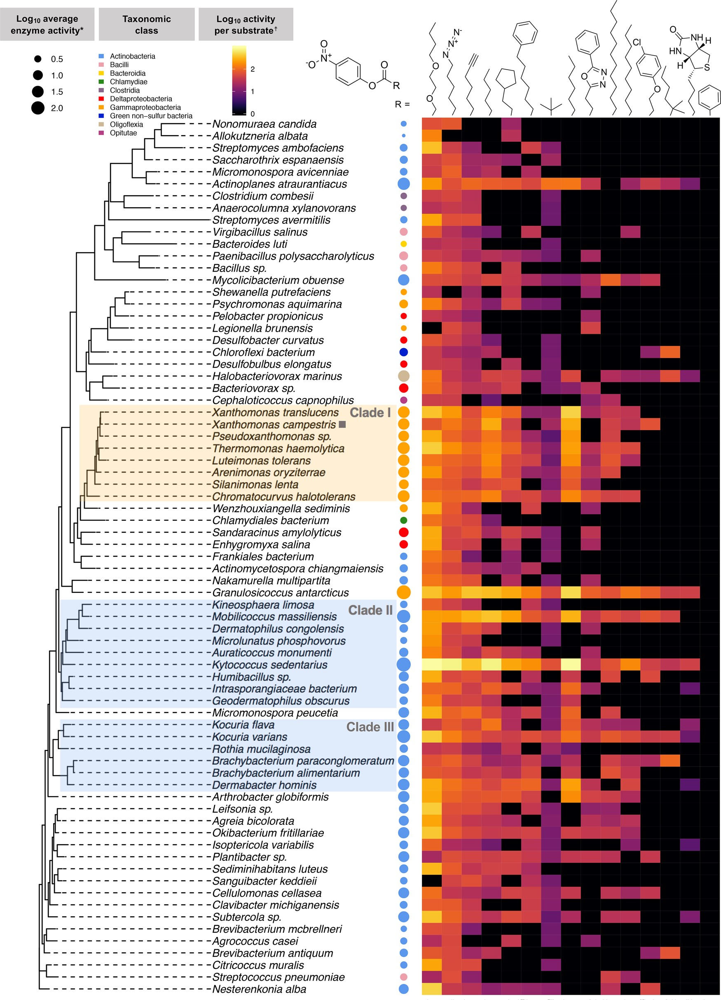

In [1]:
#| code-fold: true
import pandas as pd 
import json
from AWSTools.Batchtools import batch_utils as bu 
import openprotein
from scipy.stats import spearmanr
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from pandas import option_context
from misc import  wait_for_job
import requests 
sns.set_style("whitegrid")

with open('secrets.config', 'r') as f:
    config = json.load(f)
session = openprotein.connect(config['username'], config['password'])

### Loading the data<a class="anchor" id="1_2"></a>

Let's first load and examine the Robinson 2020 data:

In [2]:
#| code-fold: true
data = pd.read_csv("./data/Robinson/enzyme_substrate_activity.csv")
data = data.rename(columns={"cmpnd": "compound", 'log_slope':'log_activity'})
data['compound'] = data.compound.str.replace(" ","_")

# read in sequences and match to data
sequences = bu.fasta2csv("./data/Robinson//robinson.fa")
sequences['org'] = sequences['accession'].apply(lambda x: " ".join( x.split('1_')[-1:])   )
sequences['org'] = sequences.org.str.replace("_"," ")
sequences = sequences.rename(columns={"seq": "sequence"})

# manual matches
sequences.loc[sequences.accession.str.contains("Halobacteriovorax"),'org'] = "Halobacteriovorax marinus"
sequences.loc[sequences.accession.str.contains("Enhygromyxa"),'org'] = "Enhygromyxa salina"
sequences.loc[sequences.accession.str.contains("Kocuria_varians"),'org'] = "Kocuria varians"
sequences.loc[sequences.accession.str.contains("Pseudoxanthomonas"),'org'] = "Pseudoxanthomonas"
sequences.loc[sequences.accession.str.contains("translucens"),'org'] = "Xanthomonas translucens"
sequences.loc[sequences.accession.str.contains("Leifsonia"),'org'] = "Leifsonia sp. Leaf325"
sequences.loc[sequences.accession.str.contains("Chloroflexi_bacterium"),'org'] = "Chloroflexi bacterium RBG 13 51 36"

matched = len(set(sequences.org.unique()) & set(data.org.unique()))

# merge together
data = data.merge(sequences, on='org', how='left')
assert data[data.org.isna()].shape[0]==0
data = data.sort_values(['org','compound'])

print( f"Matched {matched} out of {len(data.org.unique())} thiolases" )
data.head(3)

Matched 72 out of 73 thiolases


,filename,compound,org,log_activity,accession,sequence
404,output//2019-11-22/2019-11-22_7Ph heptanoate_a...,7Ph_heptanoate,Actinomycetospora chiangmaiensis,1.437703,WP_026204600.1_Actinomycetospora_chiangmaiensis,MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...
657,output//2019-12-13/2019-12-13_azido_all_data_c...,azido,Actinomycetospora chiangmaiensis,1.722814,WP_026204600.1_Actinomycetospora_chiangmaiensis,MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...
295,output//2019-11-15/2019-11-15_butoxy_all_data_...,butoxy,Actinomycetospora chiangmaiensis,1.989242,WP_026204600.1_Actinomycetospora_chiangmaiensis,MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...


We can see above the same data that corresponds to figure 2. We will need to wrangle the data a little to summarise replicates and add back in the 0 activity rows:

In [3]:
#| code-fold: true
# Summarize replicates
data = (
    data.groupby(['org', 'compound', 'sequence'])
    .agg(mean_log_activity=('log_activity', 'mean'),
         std_log_activity=('log_activity', 'std'),
         count_activity=('log_activity', 'count'))
    .reset_index()
)
data = data.fillna(0.0)

# add in zero-activity rows
new_df = pd.DataFrame(index=pd.MultiIndex.from_product([data['org'].unique(), data['compound'].unique()],
                                                       names=['org', 'compound']))
new_df['mean_log_activity'] = 0
new_df['std_log_activity'] = 0

# update the new dataframe with the original dataframe's values
new_df.update(data.set_index(['org', 'compound']))

# reset the index and merge
data = new_df.reset_index()
data = data.merge(sequences, on='org', how='left')
data.head()

,org,compound,mean_log_activity,std_log_activity,accession,sequence
0,Actinomycetospora chiangmaiensis,7Ph_heptanoate,1.437703,0.000000,WP_026204600.1_Actinomycetospora_chiangmaiensis,MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...
1,Actinomycetospora chiangmaiensis,azido,1.722814,0.000000,WP_026204600.1_Actinomycetospora_chiangmaiensis,MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...
2,Actinomycetospora chiangmaiensis,butoxy,1.989242,0.000000,WP_026204600.1_Actinomycetospora_chiangmaiensis,MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...
3,Actinomycetospora chiangmaiensis,cyclopentyl,1.185503,0.000000,WP_026204600.1_Actinomycetospora_chiangmaiensis,MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...
4,Actinomycetospora chiangmaiensis,heptynoate,1.448957,0.211179,WP_026204600.1_Actinomycetospora_chiangmaiensis,MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...


In [4]:
#| code-fold: true
from misc import display_side_by_side
with option_context('display.max_rows', None, 'display.max_columns', None):
    display_side_by_side( [data[['compound']].value_counts().head().reset_index().rename(columns={0:'count'}), data[['org']].value_counts().head().reset_index().rename(columns={0:'count'})] , ['Compound', "Organism"] )


,compound,count
0,7Ph_heptanoate,72
1,ClPh_propionate,72
2,TMA,72
3,azido,72
4,biotin,72
,org,count
0,Actinomycetospora chiangmaiensis,14
1,Actinoplanes atraurantiacus,14
2,Paenibacillus polysaccharolyticus,14
3,Okibacterium fritillariae,14


We have been able to reproduce most of the Robinson dataset, yielding measurements for 14 out of 15 compounds across 72 out of 73 organisms.

### Exploring the data <a class="anchor" id="1_3"></a>

We can investigate the data briefly before proceeding with PoET. 

First, let's examine the sequences from each organism to get an idea of sequence diversity:

In [5]:
#| code-fold: true
from Bio import pairwise2

def align_report(seq1, seq2):
    """Calculate the similarity between two sequences using the globalxx alignment score"""
    if seq1==seq2:
        return 1
    alignments = pairwise2.align.globalxx(seq1, seq2)
    top_alignment = alignments[0]
    print(pairwise2.format_alignment(*top_alignment) )
    return pairwise2.format_alignment(*top_alignment)

def calculate_similarity(seq1, seq2):
    """Calculate the similarity between two sequences using the globalxx alignment score"""
    if seq1==seq2:
        return 1
    alignments = pairwise2.align.globalxx(seq1, seq2)
    top_alignment = alignments[0]
    alignment_score = top_alignment[-3]
    similarity = alignment_score / len(seq1)
    return similarity

def generate_similarity_matrix(sequences):
    """Generate a similarity matrix for a list of sequences"""
    num_sequences = len(sequences)
    similarity_matrix = np.zeros((num_sequences, num_sequences))
    for i in range(num_sequences):
        for j in range(i+1, num_sequences):
            similarity = calculate_similarity(sequences[i], sequences[j])
            similarity_matrix[i, j] = similarity
            similarity_matrix[j, i] = similarity
    np.fill_diagonal(similarity_matrix, 1)
    return similarity_matrix


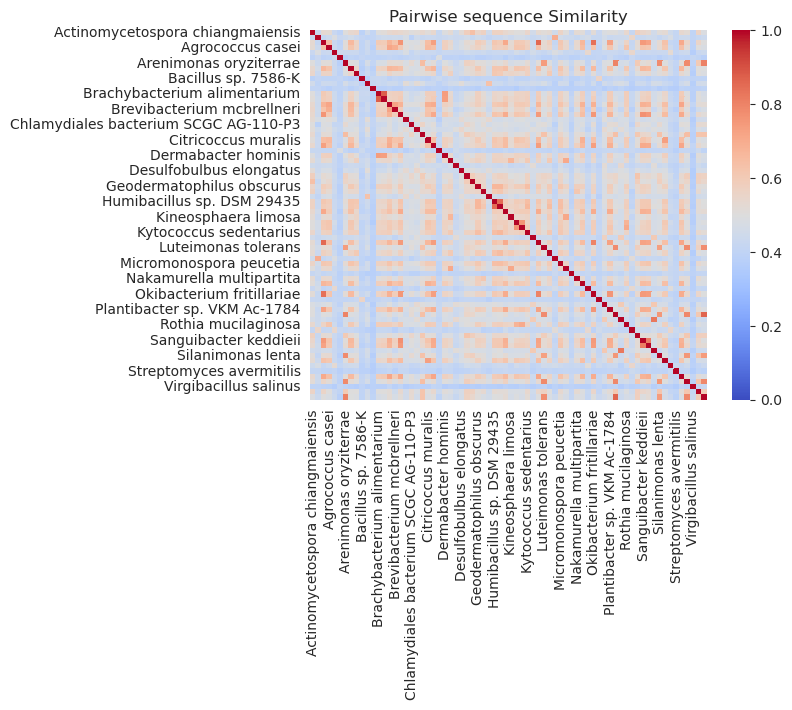

In [6]:
#| code-fold: true
unique_sequences = data.drop_duplicates('org').sequence.tolist()
unique_orgs = data.drop_duplicates('org').org.tolist()
similarity_matrix = generate_similarity_matrix(unique_sequences)

similarity_matrix = pd.DataFrame(similarity_matrix, index=unique_orgs, columns=unique_orgs)
sns.heatmap(similarity_matrix, cmap='coolwarm', vmin=0, vmax=1)
plt.title("Pairwise sequence Similarity");



In [7]:
#| code-fold: true
print("Sequence similarity summary:")
print(f"\tMean: {np.mean(similarity_matrix.values[np.triu_indices(similarity_matrix.shape[0], k=1)]):.2f} \n\tMin: {np.min(similarity_matrix.values[np.triu_indices(similarity_matrix.shape[0], k=1)]):.2f} \n\tMax: {np.max(similarity_matrix.values[np.triu_indices(similarity_matrix.shape[0], k=1)]):.2f} ")

Sequence similarity summary:
	Mean: 0.49 
	Min: 0.36 
	Max: 0.88 


We can see above that there is a lot of diversity in our sequences; the average pairwise similarity is <50%. And this covers a range from 36-88% (excluding the diagonal). This diversity of sequences makes the Robinson data very useful for evolutionary prompting. 




### Choosing a target candidate<a class="anchor" id="1_4"></a>

We can now build our prompt, to do that we will first select a good compound for development (i.e. good data availability, broad range of activity and good specificity). Once we have selected our target compound we will take the most active enzyme sequence as a seed to generate an MSA, and then impose filters on that MSA to create a prompt. 


First, let's see how much non-zero data is available for each compound, choosing a compound with more data will make the resulting analysis more robust:

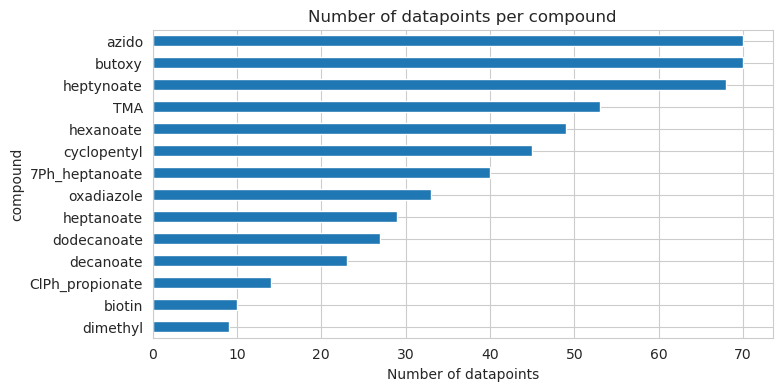

In [8]:
# compounds with most data
ordered_compounds = data[data.mean_log_activity!=0].compound.value_counts().index.tolist()
data[data.mean_log_activity!=0].compound.value_counts()[::-1].plot(kind='barh', figsize=(8, 4)); 
plt.title("Number of datapoints per compound");
plt.xlabel("Number of datapoints");

We can see above the number of data points per compound; `azido`, `butoxy` and `heptynoate` have the most available data, covering >90% of the enzymes. 

We also want a target compound with a reasonable *range* of activities for two reasons:

- 1) ideally measurement error should be smaller than true activity differences, this is more likely for larger data ranges
- 2) a larger range suggests more scope for improved enzymatic activity, and a more interesting fitness landscape

I've plotted the range of activities below per compound: 

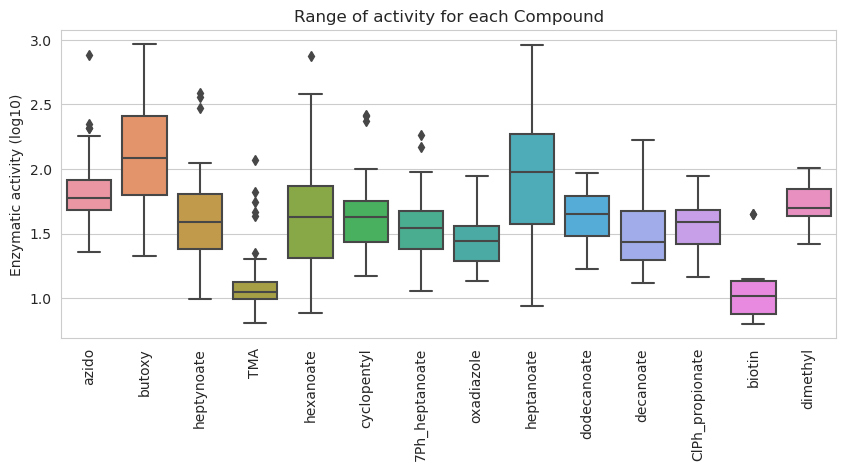

In [9]:
#| code-fold: true
f, ax = plt.subplots(figsize=(10, 4))
sns.boxplot( data.query("mean_log_activity!=0"), x='compound', y='mean_log_activity',ax=ax, order=ordered_compounds)
plt.xticks(rotation=90)
plt.title("Range of activity for each Compound");
plt.ylabel("Enzymatic activity (log10)");
plt.xlabel('');

We can see `butoxy`, `hexanoate` and `heptanoate` all have broad ranges of activity. `Butoxy` was also noted above for its data availibility.

Lastly, let's look at enzyme specificity, here defined as the correlation in activity across compounds. Specific enzymes are usually more highly valued than promiscuous enzymes, partly due to their greater efficiency and production of fewer by-products. Therefore we want to pick a compound that will enable us to prompt for specificity (as well as activity). 

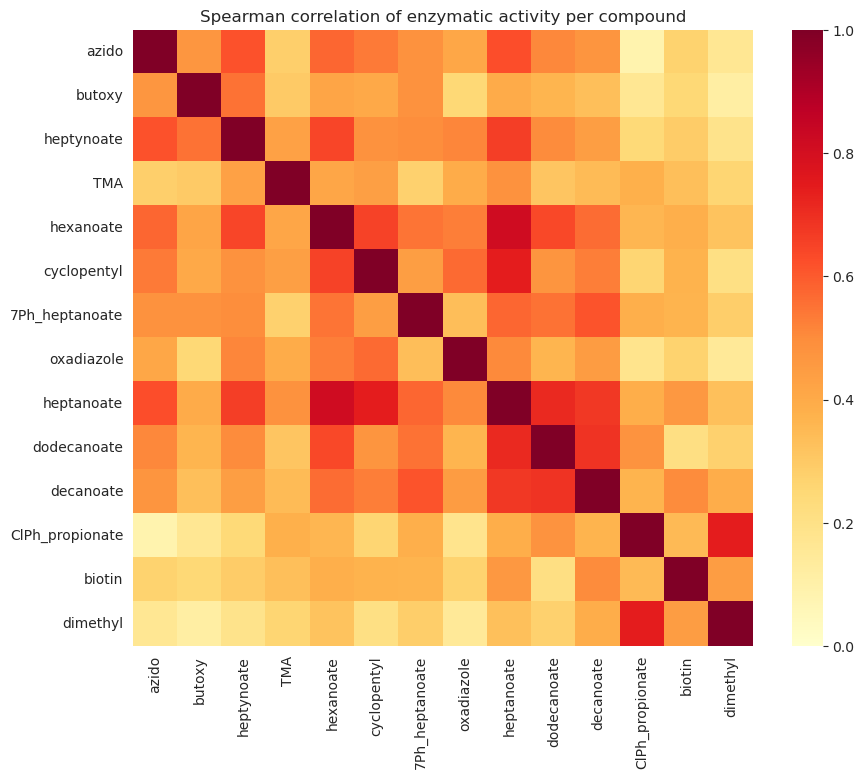

In [10]:
#| code-fold: true
compound_activity_corr = np.zeros((len(ordered_compounds), len(ordered_compounds)))
for i, compound1 in enumerate(ordered_compounds):
    for j, compound2 in enumerate(ordered_compounds):
        compound1_data = data[(data.compound==compound1)]
        compound2_data = data[(data.compound==compound2)]
        compound_activity_corr[i, j] = spearmanr(compound1_data.mean_log_activity, compound2_data.mean_log_activity)[0]
    
compound_activity_corr = pd.DataFrame(compound_activity_corr, index=ordered_compounds, columns=ordered_compounds)

f, ax = plt.subplots(figsize=(10, 8))

sns.heatmap(compound_activity_corr, cmap='YlOrRd', vmin=0, vmax=1, ax=ax);
plt.title("Spearman correlation of enzymatic activity per compound");

This same data is summarized futher (mean correlation) in the table below: 

In [11]:
#| code-fold: true
compound_activity_corr.mean(axis=1).round(2).reset_index().rename(columns={0:'mean correlation'}).sort_values('mean correlation', ascending=False)

,index,mean correlation
8,heptanoate,0.60
4,hexanoate,0.56
10,decanoate,0.53
2,heptynoate,0.51
5,cyclopentyl,0.51
9,dodecanoate,0.51
6,7Ph_heptanoate,0.49
0,azido,0.47
7,oxadiazole,0.42
3,TMA,0.40


We can see most specific enzymes target `dimethyl`, with `butoxy` a little further up the list. 

Based on the above findings, [butoxy](https://pubchem.ncbi.nlm.nih.gov/compound/2-_2-Butoxyethoxy_ethyl-acetate#section=Molecular-Formula){target="_blank"} stands out as a promising compound to focus on for several reasons:

- Extensive experimental data: Butoxy has many non-zero data points. 
- Wide range activity: Butoxy activity spans 1-2 orders of magnitude.
- Specificity: Butoxy is only weakly correlated to other compounds.

Moreover, the most recent [data](https://pubchem.ncbi.nlm.nih.gov/compound/2-_2-Butoxyethoxy_ethyl-acetate#section=U-S-Production){target="_blank"} available lists production of butoxy at 10-50 million pounds per year in the USA. This is used in diverse applications such as:

- Paint additives: plasticizers in paints improve durability and flexibility.
- Cosmetics and personal care: butoxy solvents prevent ingredient separation and maintain clarity, even at high temperatures.
- Hygeine and cleaning: due to its effective ability to dissolve grease and dirt.

Considering these factors, the development of an enhanced butoxy-specific thiolase would yield significant industrial benefits via potential gains in product performance, cost-effectiveness, and sustainability.

In [12]:
#| code-fold: true
selected_compound = 'butoxy'

Let's briefly examine the `butoxy` data a little more closely. 

Below is the correlation between `butoxy` activity and every other compound in our Robinson dataset. We can see the weakest correlation is against `dimethyl`, `ClPhpropionate` and `oxadiazole`. These will serve as interesting negative controls later on.

In [13]:
#| code-fold: true
compound_correlations = compound_activity_corr[selected_compound].sort_values().round(2)
least_correlated_compound = compound_correlations.index[0]

compound_correlations.reset_index().rename(columns={'index':'compound', selected_compound:'correlation'} )

,compound,correlation
0,dimethyl,0.12
1,ClPh_propionate,0.16
2,oxadiazole,0.25
3,biotin,0.25
4,TMA,0.30
5,decanoate,0.33
6,dodecanoate,0.36
7,heptanoate,0.40
8,cyclopentyl,0.40
9,hexanoate,0.42


Let's also take a closer look at the distribution of `butoxy` activity per enzyme (below), we can see this spans 1-2 orders of magnitude, with K. sedentarius having the most active thiolase:

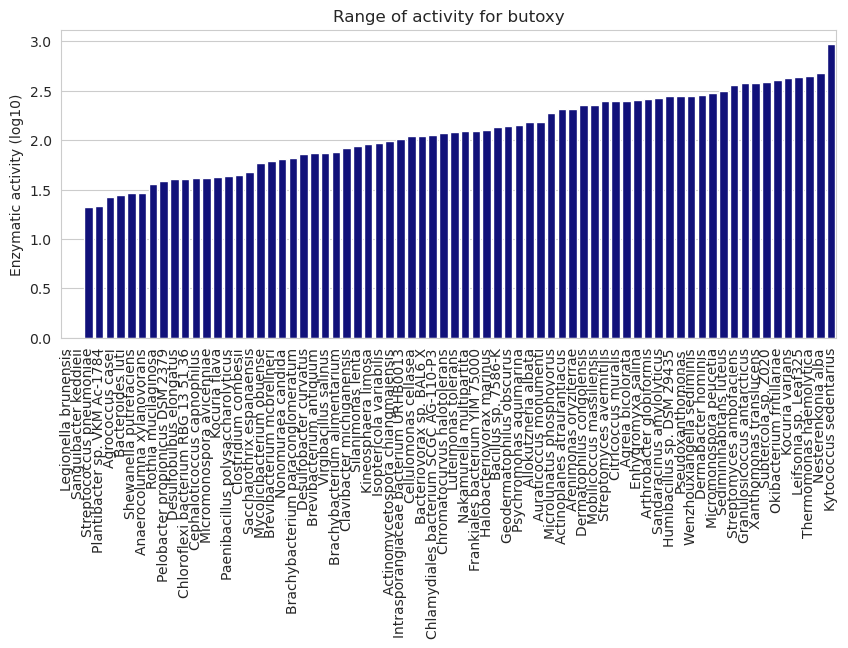

In [14]:
#| code-fold: true
f, ax = plt.subplots(figsize=(10, 4))
sns.barplot( data.query("compound== @selected_compound ").sort_values('mean_log_activity'), x='org', y='mean_log_activity',ax=ax, color='darkblue' )
plt.xticks(rotation=90)
plt.title(f"Range of activity for {selected_compound}");
plt.ylabel("Enzymatic activity (log10)");
plt.xlabel('');

### Summary <a class="anchor" id="1_5"></a>

We have 72 enzymes that catalyse 14 thiols with a range of activity. We have selected `butoxy` as our target compound due to it's data availability and industrial importance. *Kytococcus sedentarius* represents the most active butoxy thiolase in our dataset.


## PoET thiolase scoring <a class="anchor" id="2_0"></a>

### Job creation <a class="anchor" id="2_1"></a>

Having explored the data and selected `butoxy` catalysis as our main goal, we can now proceed to the PoET job, and scoring all 72 enzymes. 

We will build a prompt around the most active `butoxy` catalysing enzyme (from `K. sedentarius`), and compare our model scores with experimental data from Robinson. 


In [15]:
#| code-fold: true
x = data.query("compound==@selected_compound").sort_values('mean_log_activity', ascending=False)
msa_seed = x.sequence.tolist()[0]
msa_seed_id = x.org.tolist()[0] 
print(f"Selected compound: {selected_compound}")
print(f"Most active {selected_compound} enzyme: {msa_seed_id}")
print("Enzyme sequence:", msa_seed)

Selected compound: butoxy
Most active butoxy enzyme: Kytococcus sedentarius
Enzyme sequence: MPGNATFRHSNTSVLSVTALPAPEVHTSAEFDARIMDTLRRNKLVPGVLSRLVGIKERRWWPEDVHFTEAAAEAGRRALVDAGIKPEQVGLMVNTSVSRDHLEPSTAVRIHDTLGLPRSASNFDVTNACLGFVNGMQIAAAMIDSGQIEYALIVNAETTRHTHETTLKRLESEDATADDVLQQLATLTLGSGAAAMVLGRTDKHPEGHRFVGGVSRAGTEHHELCVGDFDRMTTDSVGLQEAGIALSEELWAEAAEEFDWQHLDRYVIHQVSTVHTEQICDRLGLDGAKVPRTFPTYGNMGPAAVPFTLALEAPHLERGDRVLLMGIGSGLNACCAEIEW


In [16]:
#| code-fold: true
# one sequence per organism, save to file
data.query("compound==@selected_compound")['sequence'].to_csv("./data/query_data.csv", index=False)

We can now kick off the job! 

I will upload the query sequences (to be scored) as well as the seed sequence (to generate the MSA and prompt). For the prompt, I have selected hyper-parameters that will filter the MSA down to sequences that are at least somewhat similar to the seed sequence. 

The exact arguments are:

- Use first sequence as seed to generate MSA = `True` (i.e. use *K. sedentarius* sequence to generate MSA)
- number of prompts to ensemble = `1` (ensemble only 1 replicate for now)
- minimum similarity to seed = `0.5` (ensure all prompt sequences have >50% sequence similarity to the seed. This is important to select for butoxy activity specifically, and not just thiol activity in general)
- Homology level = `0.5` (the tolerance for redundant sequences in the prompt, sequences with >0.5 similarity will be considered redundant and downsampled)
- always include seed sequence: `True` (i.e. ensure *K. sedentarius* sequence is always included in the prompt)
- maximum number of sequences = `50` (the total number of sequences per replicate)
- random seed = `42` (for reproducible results)



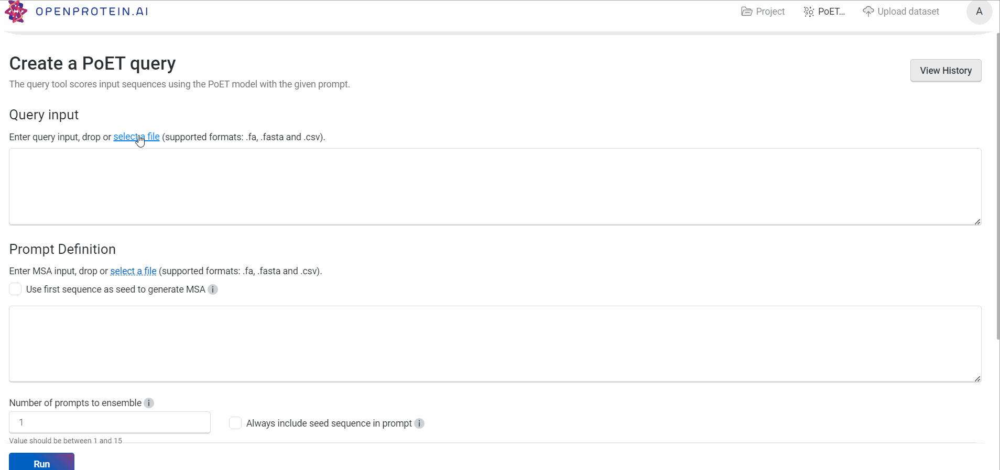

In [17]:
#| code-fold: true
results_path = "./results/Robinson2020/prots2prot-query.csv"

scoring_job_id = '26a43427-796e-4fc6-8c4a-31ca6109fa0b'
evo_prompt_id = '3e581bc1-353e-4dfc-aeb4-82e1e6b5843e'
scoring_result = pd.read_csv(results_path)
print(f"Reading from {scoring_job_id}")
scoring_result.head(3)
    

Reading from 26a43427-796e-4fc6-8c4a-31ca6109fa0b


,scores,sequence,score
0,[-492.5433044433594],MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...,-492.543304
1,[-703.46240234375],MNVGITGIAYALPAREVTTAELQRRVAPKLPPRMFEQATGITRRRV...,-703.462402
2,[-219.8573303222656],MDGNATTTHRNVALLSVATTMATRITTSAEIDRRLAPSLKRLKLPT...,-219.857330


### Prompting PoET <a class="anchor" id="2_2"></a>
Let's examine the MSA constructed from our seed sequence (before any filtering, such as `minimum similarity` is applied):

In [18]:
#| code-fold: true
response = session.prots2prot.get_msa(scoring_job_id)
msadf = pd.DataFrame(list(response), columns=['name','sequence'])
print("Number of sequences in MSA:", len(msadf))
print("Sample:")
msadf.head(10)

Number of sequences in MSA: 1604
Sample:


,name,sequence
0,seed,MPGNATFRHSNTSVLSVTALPAPEVHTSAEFDARIMDTLRRNKLVP...
1,A0A892J436,MPGNATFRHTNTSVLSVTGLPAPEVHTSAEFDARIMDTLRRNKLVP...
2,A0A1F1KA82,MPGNATFRHSNTSILSVTGLPAPEVRTSAEFDERIMDTLRRNRLVP...
3,A0A4Q7V0T1,MTGTALFHHDNTVIVSVCGIDAPTVVTSAEIDDRLSDTYERLELRP...
4,A0A516PWD2,MSGNATYRLTNTSMLSVSAIEAPVVATSEEFDDRLEATYRRTGLRR...
5,A0A495XTP4,MSGNATFRYANTAVLSVCAVDAPVVMTSDAFDEKLLETYARVGLRS...
6,A0A839QRV3,MGGNATFRHDNSALLAIGSVEAPVVVTSDEFDRRLAPSLKRLRLSR...
7,A0A176UIU6,MIGNATFRHRNTALLSVISVQAPRIVSSTEFDHRLASTLRRLKFPP...
8,A0A838H8R0,MTGNGIFRSSNTSVLAVDALDAPRVVTSAELDERLSATYRRVGLRP...
9,A0A3N0C1T5,MIGNATFRHRNTALLSVSSVEAPKVVSSAEFDHMLAPTLQRLKFPP...


We have >1600 sequences in the MSA, and we told the prompt to take up to 50 (per replicate). 

Let's see how many sequences are in the prompt:

In [19]:
#| code-fold: true
response = session.prots2prot.get_prompt(scoring_job_id, prompt_index=1)
promptdf = pd.DataFrame(list(response), columns=['name','sequence'])
#rename seed from 101 to uniprotkb entry 
promptdf.loc[promptdf.name=='101', 'name'] = 'C7NEV1'
print("Number of sequences in prompt:", len(promptdf))
print("Sample:")
promptdf.head(10)

Number of sequences in prompt: 50
Sample:


,name,sequence
0,seed,MPGNATFRHSNTSVLSVTALPAPEVHTSAEFDARIMDTLRRNKLVP...
1,A0A1F1KA82,MPGNATFRHSNTSILSVTGLPAPEVRTSAEFDERIMDTLRRNRLVP...
2,A0A516PWD2,MSGNATYRLTNTSMLSVSAIEAPVVATSEEFDDRLEATYRRTGLRR...
3,A0A543KKX1,MNGNATFRHHDTAVLSVTAVDAPVVKTSDDFDEVLADSYRRNGLRP...
4,A0A098YAU2,MSGNATHRFSNTSILTVQTADASQVVTSDDIDQRLADTYKRVGLRP...
5,UPI001C43CB83,MPGNATFHHRNASLLSVTEVQAPEVLTSKDLDKRLGDALKRLRLPT...
6,UPI000975AA8B,MPGNATTHFDDVALVSVASVLPSRVTTSDDIEERLAPALKRLKLKP...
7,UPI001C67085F,MSGNITFRHHDTAVLAVTAVDAPVVKTSEEFDAIIGDSYTRNGLRP...
8,UPI00047A1E2B,MTGNFNFRHRNTALLGVESVEAPVIITSAEFDRILSPALRRLRLSK...
9,UPI001963D3D9,MAGNAIHRFANTTVLAVCAIDAPRVVTSAEIDERLADVYTRVSLRP...


The prompt filtering resulted in 50 sequences, including the seed sequence (`C7NEV1`). Exactly as expected (though <50 would also be expected with more stringent filtering). 

We can also sense-check that the prompt doesn't simply contain the query sequences:

In [20]:
#| code-fold: true
# Use all the prompts combined
response = session.prots2prot.get_prompt(scoring_job_id)
promptdf = pd.DataFrame(list(response), columns=['name','sequence'])
promptdf = promptdf.drop_duplicates().reset_index(drop=True)
print("Total sequences across all replicates:", promptdf.shape[0])

Total sequences across all replicates: 50


In [21]:
#| code-fold: true
print(f"Number of overlapping sequences in prompt and query: {len(set(unique_sequences) & set(promptdf.sequence.unique().tolist()))}")
x = [i for i in unique_sequences if i in promptdf.sequence.unique().tolist()]
data.query("compound==@selected_compound").set_index('sequence').loc[ x ]

Number of overlapping sequences in prompt and query: 2


,org,compound,mean_log_activity,std_log_activity,accession
sequence,,,,,
MPGNATFRHSNTSVLSVTALPAPEVHTSAEFDARIMDTLRRNKLVPGVLSRLVGIKERRWWPEDVHFTEAAAEAGRRALVDAGIKPEQVGLMVNTSVSRDHLEPSTAVRIHDTLGLPRSASNFDVTNACLGFVNGMQIAAAMIDSGQIEYALIVNAETTRHTHETTLKRLESEDATADDVLQQLATLTLGSGAAAMVLGRTDKHPEGHRFVGGVSRAGTEHHELCVGDFDRMTTDSVGLQEAGIALSEELWAEAAEEFDWQHLDRYVIHQVSTVHTEQICDRLGLDGAKVPRTFPTYGNMGPAAVPFTLALEAPHLERGDRVLLMGIGSGLNACCAEIEW,Kytococcus sedentarius,butoxy,2.968362,0.087611,WP_012802190.1_Kytococcus_sedentarius
MSENASYRLANCSILSVSTVEAPEVVTSDHLDELLQPAYDTTGMMAGQIERLAGVRERRWFPKDADYTRGAVEAGRQAIADARIDADRIGLIVNASVTRPHLEPGISAMVHAELELPRSCIAFDVTNACLGVVNSLQIAGTMIDAGQIEYALIVASEGARQMQEASIARLVDGGSRQDVKDAFATMTLGSGAVGIVLGRSDRHPEGHQIIGGITRAGTEHHELCIGGMDGMRTDASKLFVEGLSLATDAWAEAKGEWDWEEMDWYVAHQTSTAHIACLCDTLKLPAEKFPVTVDTYGNIGPVALPFTLGMYQHKMRKGDRVLLMGIGSGLNTSMTEVRW,Mobilicoccus massiliensis,butoxy,2.360310,0.106454,WP_040156198.1_Mobilicoccus_massiliensis


In [22]:
#| code-fold: true
print(f"Sequence similarity K. sedentarius v  M. massiliensis: {calculate_similarity(x[0], x[1]):.2f}")

Sequence similarity K. sedentarius v  M. massiliensis: 0.56


As well containing the original seed (as requested in our prompt definition), the prompt also contains a sequence from *Mobilicoccus massiliensis* (which is also part of the *Micrococcales* order, and also highly active against butoxy - so no surprise our MSA captured it). 

The remaining 48 sequences are from organisms not in our dataset. Let's try to find these in Uniprot. As the MSA uses ColabFold, which contains metagenomic and transcriptomic data, we may not find all the sequences in the UniProtKB. These will be marked `notfound` below:


In [23]:
#| code-fold: true
prompt_orgs = [] 
for accnumber in promptdf.name.unique()[0:]:
    if accnumber == '101':
         continue 
    r = requests.get(f"https://www.uniprot.org/uniprotkb/{accnumber}.json", timeout=3)
    prompt_orgs.append((accnumber, r.json().get('organism', {}).get('scientificName', 'notfound'), r.json().get('organism', {}).get('lineage', [] )))

promptdf = pd.DataFrame(prompt_orgs, columns=['accnumber', 'organism', 'lineage']).merge(promptdf, left_on='accnumber', right_on='name')
# we know M. massiliensis 
assert promptdf.loc[promptdf.accnumber=='UPI00059046A7', 'sequence'].tolist()[0]== data.loc[data.org=='Mobilicoccus massiliensis', 'sequence'].tolist()[0]
promptdf.loc[promptdf.accnumber=='UPI00059046A7', 'organism'] = 'Mobilicoccus massiliensis'
promptdf.organism.value_counts()

organism
notfound                                                                            24
Plantibacter sp. VKM Ac-1784                                                         1
Pirellulimonas nuda                                                                  1
Brevibacterium luteolum                                                              1
Lysobacter sp. Root604                                                               1
Xanthomonas sacchari                                                                 1
Lysobacter sp                                                                        1
Nakamurella sp. PAMC28650                                                            1
Acidimicrobiia bacterium                                                             1
hydrothermal vent metagenome                                                         1
Microbacterium halimionae                                                            1
Egicoccus halophilus              

We can see above we were able to ascertain the origins of just over half the prompt sequences, suggesting the other half came from metagenomic or transcriptomic sources. 

Below, I have summarised the taxonomic order for the sequences present in UniProtKB:

In [24]:
#| code-fold: true
promptdf.loc[promptdf['lineage'].apply(len) >=3].lineage.apply(lambda x: x[2]).value_counts()

lineage
Micrococcales             7
Propionibacteriales       4
Gammaproteobacteria       4
Geodermatophilales        2
Kineosporiales            1
Nitriliruptoria           1
ecological metagenomes    1
Acidimicrobiia            1
Nakamurellales            1
Planctomycetia            1
Name: count, dtype: int64

We can see the prompt is quite diverse, containing 10 different taxonomic orders. 

### Scoring results <a class="anchor" id="2_3"></a>

We can now turn to the PoET results. PoET modelling will return a log-liklihood (LL) score to evaluate the fitness of our queries against the prompt. The higher the score (i.e. less negative) the better the sequence (the more fit). 

We can download our results for further analysis from the UI:


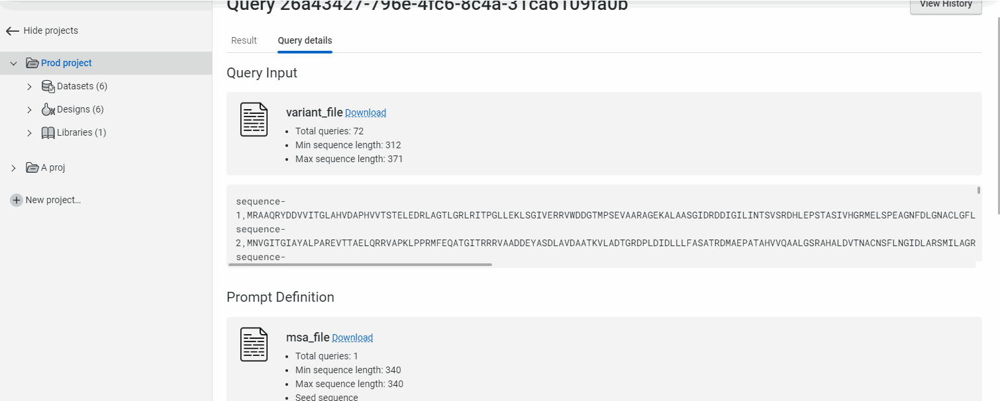

In [25]:
#| code-fold: true
scoring_result.head()

,scores,sequence,score
0,[-492.5433044433594],MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...,-492.543304
1,[-703.46240234375],MNVGITGIAYALPAREVTTAELQRRVAPKLPPRMFEQATGITRRRV...,-703.462402
2,[-219.8573303222656],MDGNATTTHRNVALLSVATTMATRITTSAEIDRRLAPSLKRLKLPT...,-219.857330
3,[-328.9368896484375],MRGNATTRHSNVALLGITEAVAPVEVSSKSFDDRLADTLKTLRLPK...,-328.936890
4,[-766.7886352539062],MTYSRIGQIAVHLPEGGRTSAEVEALVAELNPGFEPPEGLIERFTG...,-766.788635


We expect 72 results, one for each enzyme uploaded:

In [26]:
#| code-fold: true
print(scoring_result.shape[0], "results found")
compound_scores = scoring_result.merge(data.query("compound==@selected_compound"), on='sequence')

72 results found


Now let's see how well our PoET model scores correlate with the experimental activity data against `butoxy`:

Spearman correlation between score and mean_log_activity: 0.41, p=0.00


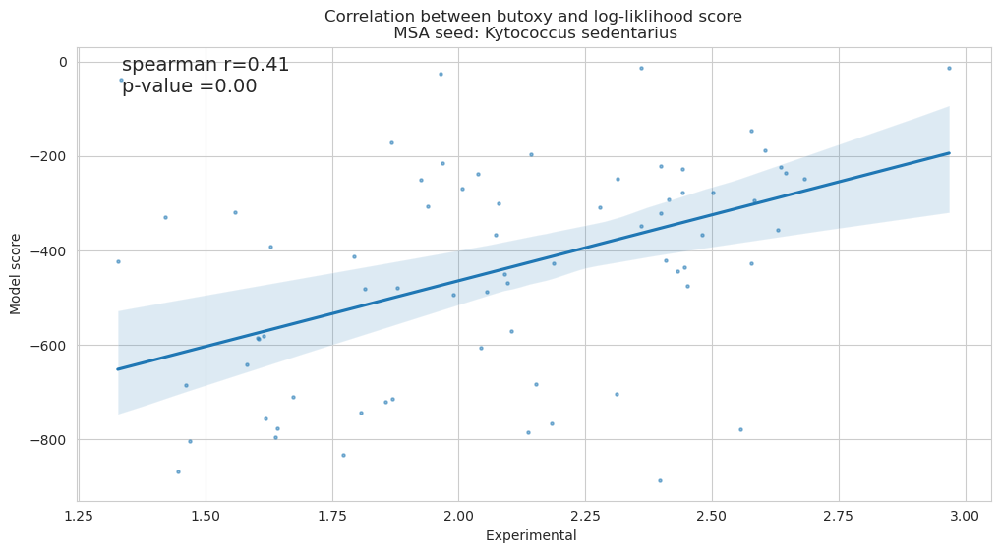

In [27]:
#| code-fold: true
x = compound_scores.query("mean_log_activity>0") # drop 0 active rows
r,p = spearmanr(x['score'], x['mean_log_activity'])
r,p = np.round(r,2), np.round(p,2)
print(f"Spearman correlation between score and mean_log_activity: {r:.2f}, p={p:.2f}")

f, axs = plt.subplots(1,1, figsize=(12,6), sharex=True)
ax = axs
# full results
sns.regplot(data=x,
            x='mean_log_activity',
            y='score',
            scatter_kws={'s': 5, 'alpha': 0.5},
            n_boot=100,
            robust=True,
            ax=ax )
ax .set_xlabel("Experimental ")
ax .set_ylabel("Model score")
# add spearmanr r and p results to graph
ax .text(0.05, 0.9, f"spearman r={r:.2f}\np-value ={p:.2f}", transform=plt.gca().transAxes, size=14);
ax.set_title(f"Correlation between {selected_compound} and log-liklihood score\n MSA seed: {msa_seed_id}");


Excellent, a >0.4 correlation (p<0.05) between activity and model score with just a single sequence, and no wetlab data!

We can also examine how it performed against compounds that were weakly correlated with `butoxy` to check specificity (see the reminder below) . 


In [28]:
#| code-fold: true
print("Weakest correlation to butoxy activity:")
compound_correlations.head(3).reset_index().rename( columns={'index':'compound', selected_compound:'correlation'} )

Weakest correlation to butoxy activity:


,compound,correlation
0,dimethyl,0.12
1,ClPh_propionate,0.16
2,oxadiazole,0.25


Given the nature of the prompt we supplied, we expect there to be very little correlation between our model scores and experimental activity for these 3 compounds: 

/opt/conda/envs/py38/lib/python3.8/site-packages/statsmodels/robust/robust_linear_model.py:288: ConvergenceWarning: Estimated scale is 0.0 indicating that the most last iteration produced a perfect fit of the weighted data.
  warnings.warn('Estimated scale is 0.0 indicating that the most'


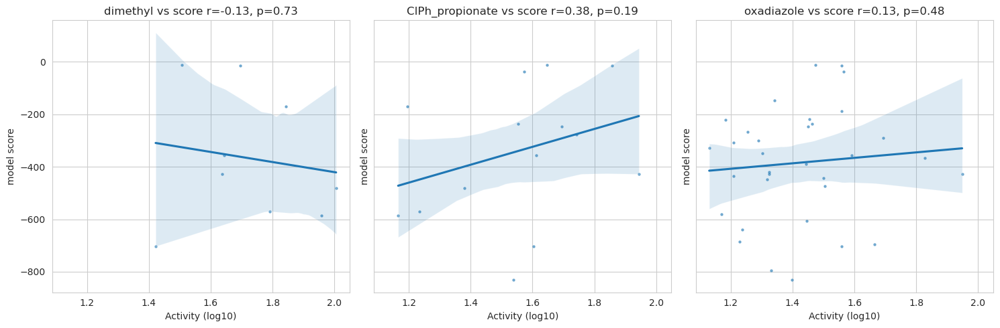

In [29]:
#| code-fold: true
f, axs = plt.subplots(1,3,figsize=(15,5), sharex=True, sharey=True)
axs = axs.flatten()

for i, compound in  enumerate(compound_correlations.index.tolist()[0:3]):
    x = scoring_result.merge(data.query("compound==@compound"), on='sequence')
    x = x.query("mean_log_activity!=0")
    r,p = spearmanr(x['score'], x['mean_log_activity'])  
    sns.regplot(data=x,
                x='mean_log_activity',
                y='score',
                scatter_kws={'s': 5, 'alpha': 0.5},
                n_boot=100,
                robust=True,
                ax=axs[i] )
    axs[i].set_ylabel("model score")
    axs[i].set_xlabel("Activity (log10)")
    # add spearmanr r and p results to graph
    axs[i].set_title(f"{compound} vs score {r=:.2f}, {p=:.2f}");
plt.tight_layout()

As expected, our p-values are all >0.05, indicating a non-significant relationship between fitness (which we defined using a butoxy thiolase) and experimental activity against `dimethyl`, `ClPh propionate` and `oxadiazole`! This suggests our prompt was succesful in encoding the features that make our butoxy thiolase specific and active!


Note that the key to success here is two things (in order of importance):

1. `minimum similarity` sets a floor in how similar our prompt sequences are to the *K. sedentarius* seed. This is important as we need our prompt to reflect butoxy activity specifically (and not thiolases in general). 
2. `homology level` sets a ceiling on redundant sequences, ensuring the prompt is still diverse even after the minimum similarity step. 

For reference, you can see the results from the default prompt settings (*min. similarity = 0, homology level =0.8*) in the [appendix](#Appendix). This yields a correlation coefficient of 0.26 (p=0.03). Which is significant, but far below the 0.4 with the more thoughtful prompt above. 

### PoET scoring Summary <a class="anchor" id="2_4"></a>

This is a data-free way to start interrogating sequences for fitness, in this example, we took a series of thiolases and created a prompt to reflect butoxy catalysing activity. We achieved this by using the most active enzyme for butoxy catalysis as a seed for an MSA, and then a series of filters to ensure the resulting prompt looked reasonably like the original enzyme. 

We then tested the results of this approach across 72 thiolases from 10 different taxonomic classes. This resulted in a strong (>0.4) spearman correlation between PoET model scores and experimental activity. We confirmed that this was a specific effect by comparing those same scores to `dimethyl` (and other weakly correlated thiols) catalysis - and found no significant relationship (as expected). 

## PoET de novo thiolase generation  <a class="anchor" id="3_0"></a>

### Job creation <a class="anchor" id="3_1"></a>

Now that we have a meaningful prompt, we can re-use it to generate entirely new sequences. We can use these new sequences to understand `butoxy` thiolases, and to explore sequence and structural constraints in `butoxy` catalysis. Additionally, we could run these through wetlab assays to generate more data, and start exploring the fitness landscape with empirical observations. For now, we will focus on computational insights.

To kick off the PoET generation job we will supply a few key arguments: 

- Number of sequences to generate = `50`
- top-k = `10` (at each step, sample from only the 10 most likely amino acids). 
- Maximum generated protein length = `500` (i.e. stop generating any protein beyond this size)

We have left the following arguments at their default value:

- temperature = `1.0` (this will control the creativity of the model, higher temperatures lead to more diverse output. 1.0 is a good default value)
- top-p = `1.0` (this is an alternative to top-k, where we sample from the amino acids within cumulative *p* probability distribution)


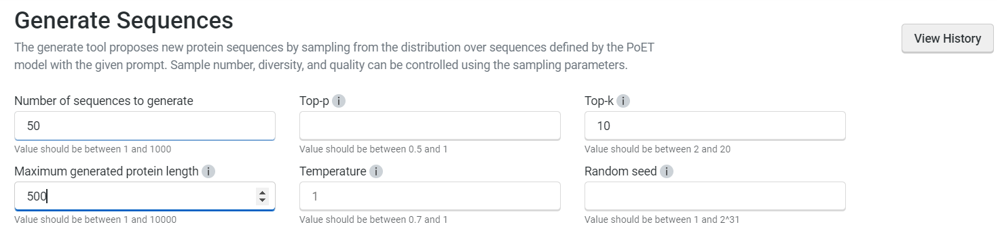

In [30]:
#| code-fold: true
gen_results_path = "./results/Robinson2020/Robinson_generate.csv"

gen_job_id = '5597d678-0bc9-4828-90af-2527e6898977'
print(f"Reading from job {gen_job_id}")
gen_score_result = pd.read_csv(gen_results_path)
gen_score_result = gen_score_result.sort_values(by='score', ascending=False).reset_index(drop=True)
gen_score_result['name'] = [f"gen-{i+1}" for i in range(gen_score_result.shape[0])]
gen_score_result[['name','sequence']].to_csv("./results/Robinson2020/colabfold_input.csv", index=False)


Reading from job 5597d678-0bc9-4828-90af-2527e6898977


### Evaluating generated sequences <a class="anchor" id="3_2"></a>

We have generated a variety of sequences with different scores, let's first download the novel sequences and scores like we did previously:


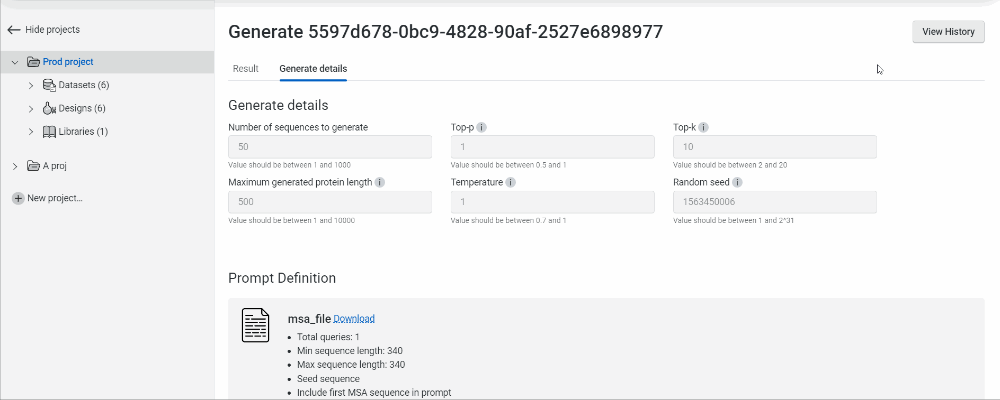

In [31]:
#| code-fold: true
gen_score_result.head()

,scores,sequence,score,name
0,[-105.93228149414062],MSENATYRLANTSVLSVSTIEAPEVVTSDHLDELLQPAYDSTGMMA...,-105.932281,gen-1
1,[-114.87188720703125],MGRNATHRFGNTSVLSVCAIEAPRTITSAEIDERLAPVYQRVGLRA...,-114.871887,gen-2
2,[-121.16313171386719],MNGNTSWRAANTALLSVTAVEAPVVVTSDELDERLAGPMARLGIRA...,-121.163132,gen-3
3,[-133.42160034179688],GNATTRFANVSLLSVASRLPSRVTPSTQIQERLGAAMTRLRLPPRL...,-133.421600,gen-4
4,[-142.5845947265625],MSGNATFRLTNTAILAVTTVEAPEVITSEQLDERLRATYDRIGMTP...,-142.584595,gen-5


Below I have plotted:

- (top) the distribution of generated sequence scores (red) against all 72 sequences in our data (grey)
- (bottom) generated sequence scores (red) against a subset of highly active sequences (light blue - defined as being more active than the median enzyme).

 We can see the scores of the generated sequences are generally right-shifted, suggesting greater fitness (defined, as we saw above, as butoxy catalysis):

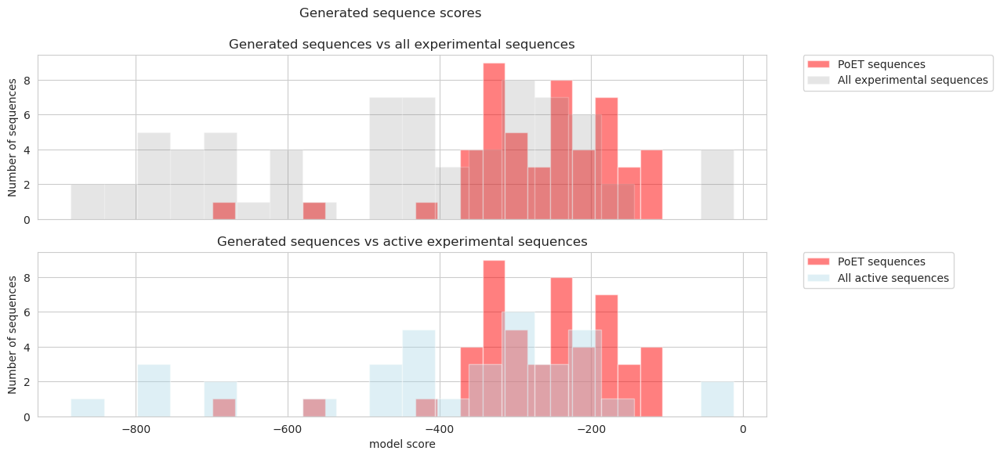

In [32]:
f, axs = plt.subplots(2,1, figsize=(12,6), sharex=True, sharey=True)
plt.suptitle("Generated sequence scores")
axs[0].set_title("Generated sequences vs all experimental sequences")
axs[0].hist(gen_score_result.score, bins=20, alpha=0.5, color='red', label='PoET sequences');
axs[0].hist(compound_scores.score, bins=20, alpha=0.2, color='grey', label='All experimental sequences');
axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axs[0].set_ylabel( "Number of sequences")

median_activity = compound_scores.mean_log_activity.median()
axs[1].set_title("Generated sequences vs active experimental sequences")
axs[1].hist(gen_score_result.score, bins=20, alpha=0.5, color='red', label='PoET sequences');
axs[1].hist(compound_scores.query("mean_log_activity>@median_activity").score, bins=20, alpha=0.4, color='lightblue', label='All active sequences');
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axs[1].set_ylabel( "Number of sequences")
plt.xlabel("model score");

We can also examine the similarity of our generated sequences; first to each other, and then to the prompt sequences. To make the plotting easier, I have named each sequence in order of descending score (so `gen-1` is the highest scoring sequence, and `gen-50` the lowest, with `gen-25` being the median scoring sequence). 

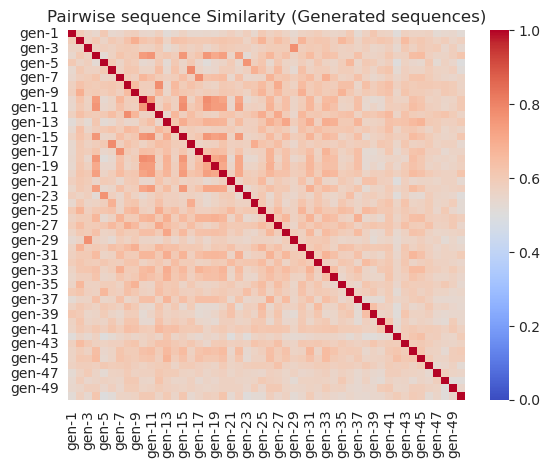

In [33]:
#| code-fold: true
generated_sequences = gen_score_result.sequence.tolist()
gen_similarity_matrix = generate_similarity_matrix(generated_sequences)

gen_similarity_matrix = pd.DataFrame(gen_similarity_matrix, index=gen_score_result.name.tolist(), columns=gen_score_result.name.tolist())
sns.heatmap(gen_similarity_matrix, cmap='coolwarm', vmin=0, vmax=1)
plt.title("Pairwise sequence Similarity (Generated sequences)");



In [34]:
#| code-fold: true
print("Sequence pairwise-similarity statistics (generated sequences):")
print(f"\tMean: {np.mean(gen_similarity_matrix.values[np.triu_indices(gen_similarity_matrix.shape[0], k=1)]):.2f} \n\tMin: {np.min(gen_similarity_matrix.values[np.triu_indices(gen_similarity_matrix.shape[0], k=1)]):.2f} \n\tMax: {np.max(gen_similarity_matrix.values[np.triu_indices(gen_similarity_matrix.shape[0], k=1)]):.2f} ")

Sequence pairwise-similarity statistics (generated sequences):
	Mean: 0.59 
	Min: 0.50 
	Max: 0.78 


We can see our 50 generated sequences are quite diverse, they have a mean pairwise similarity of <0.6, and a range of 0.5-0.78.

In [35]:
#| code-fold: true
seed_gen_sim = []
for i,seq in enumerate(generated_sequences):
    seed_gen_sim.append( calculate_similarity(msa_seed, seq) )
gen_score_result['seed_similarity'] = seed_gen_sim

Let's see how they compare to the seed sequence we used to generate the MSA and prompt:

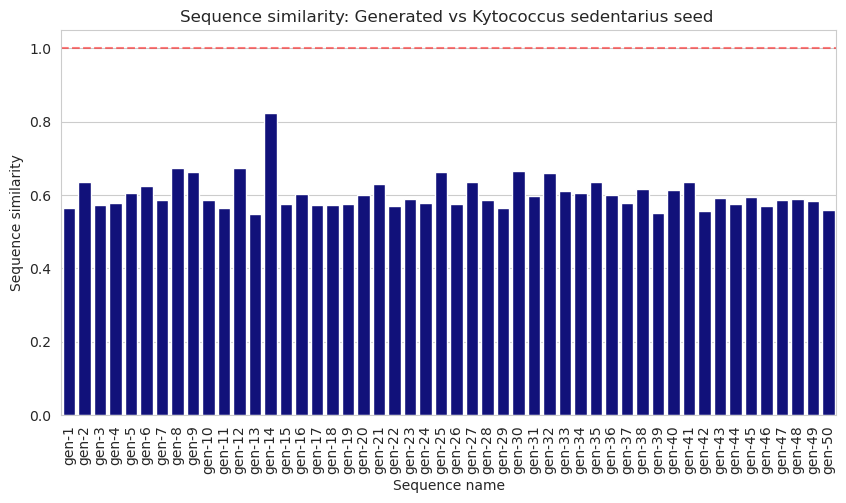

In [36]:
#| code-fold: true
f, ax = plt.subplots(1,1, figsize=(10,5))
plt.title(f"Sequence similarity: Generated vs {msa_seed_id} seed ")
sns.barplot(data=gen_score_result, x="name", y="seed_similarity", ax=ax, color='darkblue')
plt.xticks(rotation=90);
plt.xlabel("Sequence name")
plt.ylabel("Sequence similarity");
# add hline at 1 
ax.axhline(1, ls='--', color='red', alpha=0.5);

Sequences are on average ~60% similar to the seed sequence. This is roughly in line with our expectations, as we saw our diverse group of thiolases that catalyze *all* 14 compounds have approximately 50% sequence similarity. We would expect `butoxy` specific enzymes to be somewhat higher than that broad thiolase baseline.

We can also see below that there is no significant relationship between the similarity to the seed and the model score for the generated sequences: this suggests the prompt is doing a good job (and not overfitting):

Spearman correlation between score and seed similarity: 0.10, p=0.49


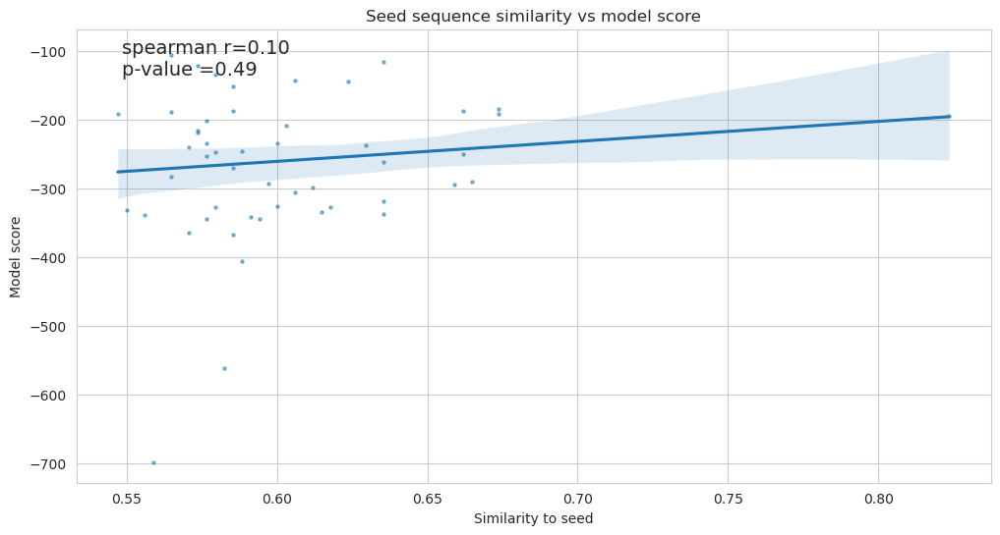

In [37]:
#| code-fold: true
r,p = spearmanr(gen_score_result['score'], gen_score_result['seed_similarity'])
print(f"Spearman correlation between score and seed similarity: {r:.2f}, p={p:.2f}")

f, axs = plt.subplots(1,1, figsize=(12,6), sharex=True)
ax = axs
# full results
sns.regplot(data=gen_score_result,
            x='seed_similarity',
            y='score',
            scatter_kws={'s': 5, 'alpha': 0.5},
            n_boot=100,
            robust=True,
            ax=ax )
ax .set_xlabel("Similarity to seed")
ax .set_ylabel("Model score")
# add spearmanr r and p results to graph
ax .text(0.05, 0.9, f"spearman r={r:.2f}\np-value ={p:.2f}", transform=plt.gca().transAxes, size=14);
ax.set_title(f"Seed sequence similarity vs model score");


In [38]:
#| code-fold: true
from multiprocessing import Pool

def calculate_similarity_wrapper(args):
    return calculate_similarity(*args)

def generate_similarity_distinct(sequences1, sequences2):
    """Generate a similarity matrix for a list of sequences"""
    num_sequences1 = len(sequences1)
    num_sequences2 = len(sequences2)

    with Pool() as p:
        similarity_matrix = np.array(p.map(calculate_similarity_wrapper, [(seq1, seq2) for seq1 in sequences1 for seq2 in sequences2]))
    
    return similarity_matrix.reshape(num_sequences1, num_sequences2)

Lastly, let's look at the sequence similarity between the prompt sequences (below heatmap, Y axis) and the generated sequences (X axis):

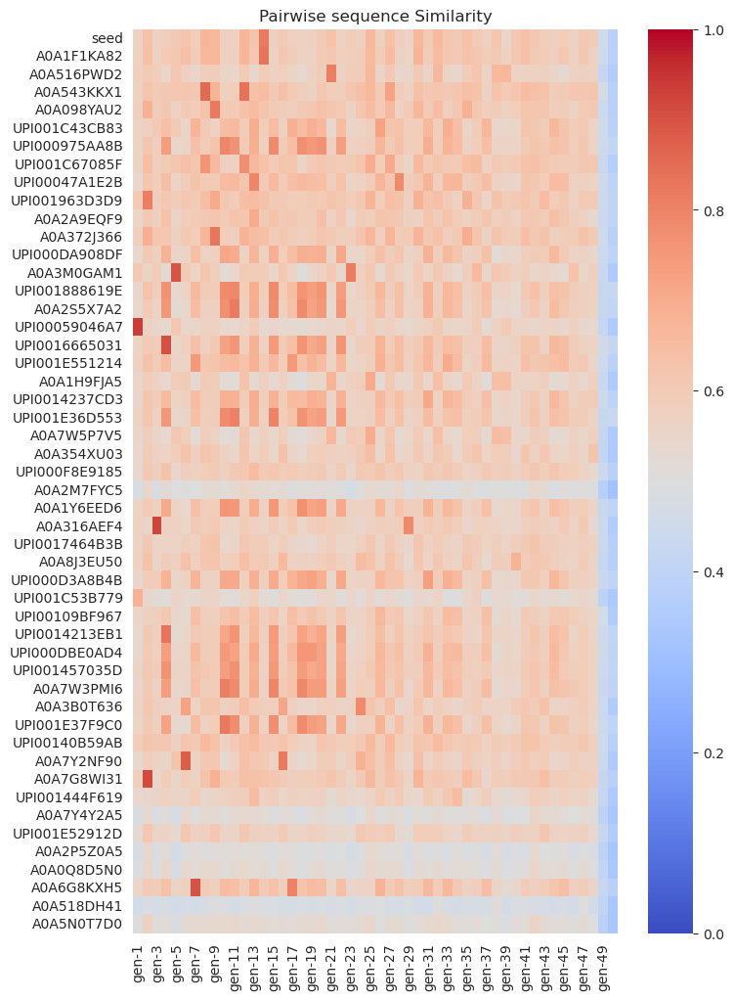

In [39]:
#| code-fold: true
compared_sim = generate_similarity_distinct(generated_sequences , promptdf.sequence.tolist() )
compared_sim = pd.DataFrame(compared_sim, index=gen_score_result.name.tolist(), columns=promptdf.name.tolist()).T


f, ax = plt.subplots(1,1, figsize=(8,12), sharex=True)
sns.heatmap(compared_sim, cmap='coolwarm', vmin=0, vmax=1, ax=ax)
plt.title("Pairwise sequence Similarity");


In [40]:
#| code-fold: true
print(f"Summary statistics for pairwise generated v prompt comparison: ")
print(f"\t Mean similarity: {compared_sim.mean(axis=None):.2f}")
print(f"\t Max similarity: {compared_sim.max(axis=None):.2f}")
print(f"\t Min similarity: {compared_sim.min(axis=None):.2f}")


Summary statistics for pairwise generated v prompt comparison: 
	 Mean similarity: 0.58
	 Max similarity: 0.94
	 Min similarity: 0.32


Again, we can see mean similarity is low (within expectations).

There are a few hotspots for the top sequences, I've investigated these below by plotting the maximum similarity to any prompt sequence, for each generated sequence:


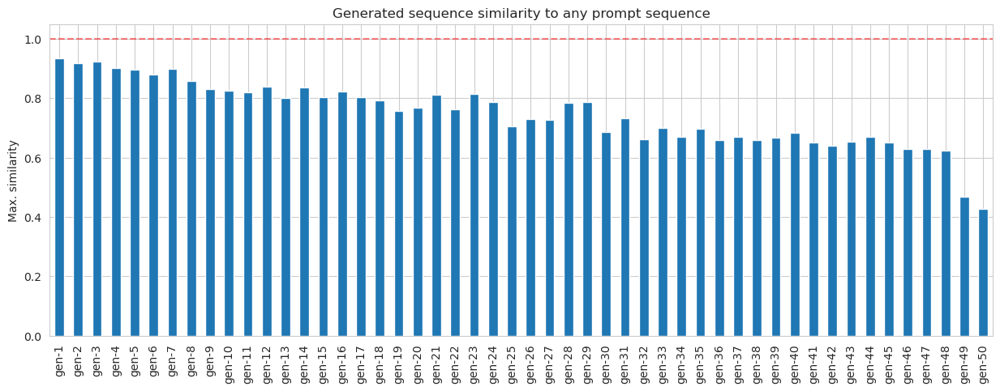

In [41]:
#| code-fold: true
gen_score_result = gen_score_result.merge( compared_sim.max(axis=0).reset_index().rename(columns={'index':'name', 0:'max_prompt_similarity'}) , on='name', how='left')

ax = compared_sim.max(axis=0).plot(kind='bar', figsize=(15, 5));
plt.ylabel("Max. similarity")
ax.axhline(1, ls='--', color='red', alpha=0.5);
plt.title("Generated sequence similarity to any prompt sequence");

In [42]:
#| code-fold: true
print(f"Average max similarity to prompt across all generated sequences: {compared_sim.max(axis=0).mean():.2f}")

Average max similarity to prompt across all generated sequences: 0.75


We see there appears to be a general trend of higher scoring sequences being more closely related to a prompt sequence (above).  This is to be expected, our scoring is defined by our prompt, so sequences more similar to the prompt will score higher (by definition). We could tweak additional parameters in the PoET generate workflow if we wanted to increase, or decrease the "creativity" of the model (for example temperature, or top p). 

Let's take two sequences;

- the best scoring (`gen-1`)
- the median scoring (`gen-25`) 

And further investigate their relationship to the prompt. 

First, we can see the full results for prompt sequence similarity for the best sequence (`gen-1`) below. Note that for this sequence, the mean similarity to the prompt sequences is 56% (range: 46-94%). 

In [43]:
#| code-fold: true
best_generated_sequence = gen_score_result.sequence.tolist()[0]

print("Prompt similarity summary for gen-1:")
print(f"\tmean: {compared_sim['gen-1'].mean():.2f}")
print(f"\tmin: {compared_sim['gen-1'].min():.2f}")
print(f"\tmax: {compared_sim['gen-1'].max():.2f}")

Prompt similarity summary for gen-1:
	mean: 0.56
	min: 0.46
	max: 0.94


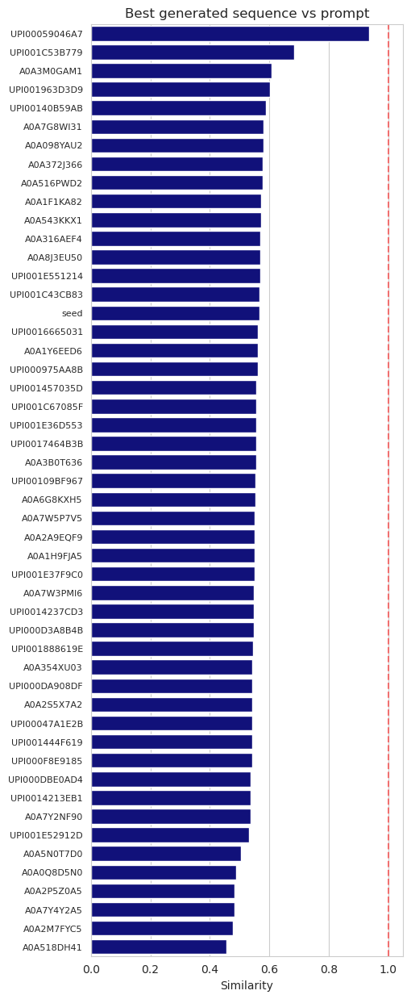

In [44]:
#| code-fold: true
f, axs = plt.subplots(1,1, figsize=(5,15), sharex=True, sharey=False)

sns.barplot(data=compared_sim['gen-1'].sort_values(ascending=False).reset_index(), x='gen-1', y='index', ax=axs, color='darkblue', orient='h')
axs.set_ylabel("")
plt.yticks(size=8)
axs.set_xlabel("Similarity")
axs.set_title("Best generated sequence vs prompt");
axs.axvline(1, ls='--', color='red', alpha=0.5);


In [45]:
#| code-fold: true
print("Best-generated sequence, closest prompt sequence:")
promptdf[promptdf.accnumber==compared_sim['gen-1'].idxmax()]

Best-generated sequence, closest prompt sequence:


,accnumber,organism,lineage,name,sequence
16,UPI00059046A7,Mobilicoccus massiliensis,[],UPI00059046A7,MSENASYRLANCSILSVSTVEAPEVVTSDHLDELLQPAYDTTGMMA...


The best scoring sequence actually shares 93.5% identity with the *M. massiliensis* we saw previously (and know to be an active `butoxy` thiolase). We therefore expect this sequence to perform well in any wetlab experiment.

Turning to the median scoring sequence:

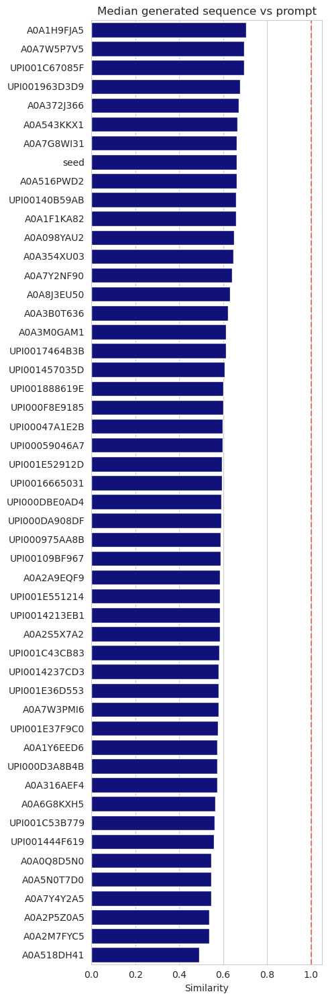

In [46]:
#| code-fold: true
f, axs = plt.subplots(1,1, figsize=(5,15), sharex=True, sharey=False)
median_name = f'gen-{len(gen_score_result)//2}'

sns.barplot(data=compared_sim[median_name].sort_values(ascending=False).reset_index(), x=median_name, y='index', ax=axs, color='darkblue', orient='h')
axs.set_ylabel("")
axs.set_xlabel("Similarity")
axs.set_title("Median generated sequence vs prompt")
axs.axvline(1, ls='--', color='red', alpha=0.5);
plt.tight_layout();



In [47]:
#| code-fold: true
median_generated_sequence = gen_score_result.sequence.tolist()[len(gen_score_result)//2]

print("Prompt similarity summary for gen-25:")
print(f"\tmean: {compared_sim['gen-25'].mean():.2f}")
print(f"\tmin: {compared_sim['gen-25'].min():.2f}")
print(f"\tmax: {compared_sim['gen-25'].max():.2f}")

Prompt similarity summary for gen-25:
	mean: 0.60
	min: 0.49
	max: 0.71


In [48]:
#| code-fold: true
print("Median-generated sequence, closest prompt sequence:")
promptdf[promptdf.accnumber==compared_sim['gen-25'].idxmax()]

Median-generated sequence, closest prompt sequence:


,accnumber,organism,lineage,name,sequence
19,A0A1H9FJA5,Microlunatus flavus,"[Bacteria, Actinomycetota, Propionibacteriales...",A0A1H9FJA5,MTGNATYELKDTAVLSVCAVEAPVVVTSEAFDERLMRSYERTGLKP...


The median scoring sequence shows a more uniform similarity to prompt sequences (mean: 60%, range: 49-71%). Note that the closest prompt sequence derives from *Microlunatus flavus*, but at 71% similarity we expect significant divergence from this organism's thiolase. 

In [49]:
#| code-fold: true
print(f"M. flavus in Robinson dataset: {promptdf[promptdf.accnumber==compared_sim['gen-25'].idxmax()].sequence.tolist()[0] in data.sequence.tolist()}")

M. flavus in Robinson dataset: False


The sequences selected above represent two good case studies for futher evaluation. One sequence is the most fit sequence generated by PoET, whilst the median sequence should more closely reflect the bulk of the data. We will investigate these structurally below. 

### Investigating generated thiolase structures

Robinson reports a conserved Cys across all thiolases that is buried in the active site and vital for activity, we can see this below, at position 129 in the MSA seed *Kytococcus sedentarius* structure from [uniprot](https://www.uniprot.org/uniprotkb/C7NEV1/entry#structure){target="_blank"} (note this is an alphafold prediction of the enzyme, as the structure is yet to be solved experimentally). 

In [50]:
#| code-fold: true
[f"Cys{i+1}" for i in range(len(msa_seed)) if msa_seed[i]=='C']

['Cys129', 'Cys225', 'Cys280', 'Cys334', 'Cys335']

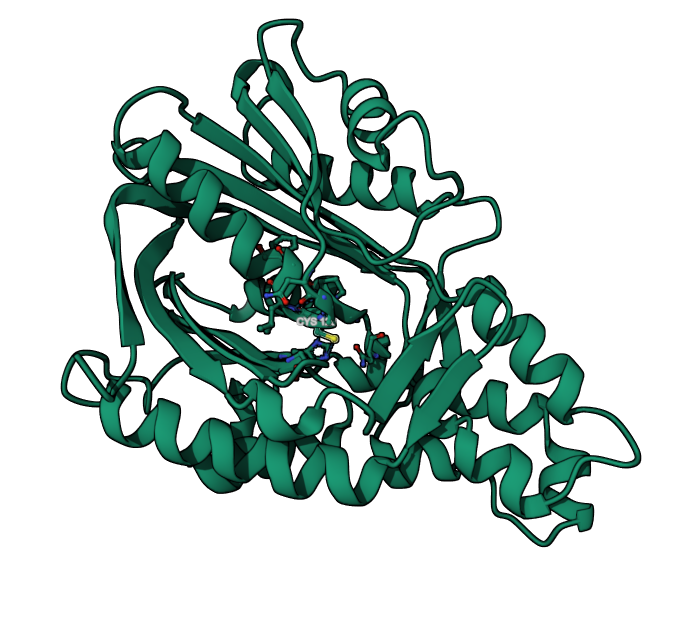

Note the key Cys129-His269 interaction in the active site below (vital for the thiolase "ping-pong" reaction mechanism). As well as the stabilising non-covalent interaction between Gly301 and the same His269. It is likely that this stabilising His-Gly hydrogen bonding pattern has a role in active site dynamics. 

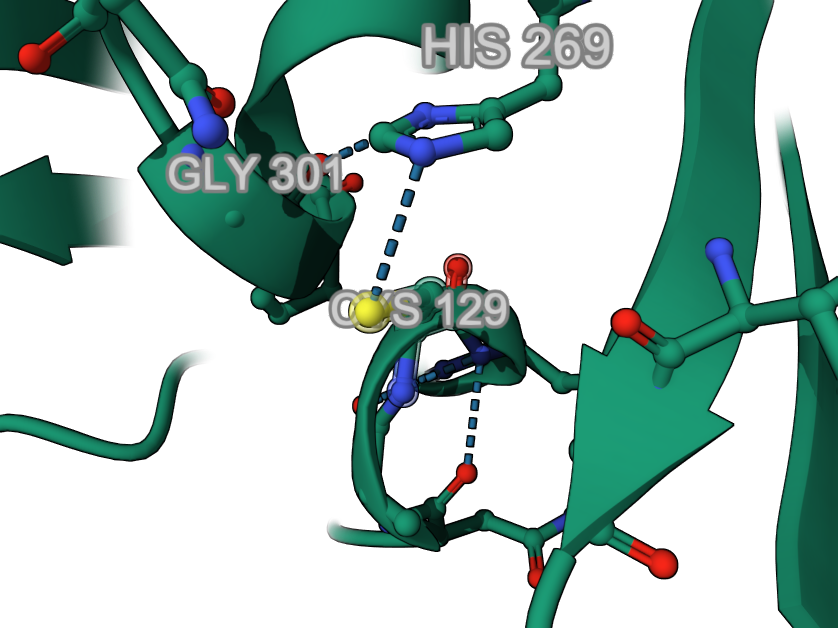

First, since we know the active site Cys is so important to catalytic activity, and that loss of this Cys would completely ablate activity,  let's examine the Cys residues in our two generated sequences of interest:

In [51]:
#| code-fold: true
seq_of_interest = ['gen-1', 'gen-25'] # best scored 3 + median

for name in seq_of_interest:
    seq = gen_score_result.loc[gen_score_result.name==name, 'sequence'].tolist()[0]
    x = calculate_similarity(msa_seed, seq)
    print(f"Sequence similarity of {msa_seed_id} and {name}= {x:.2f}")
    print(f"Cys positions for {name}:", [i+1 for i in range(len(seq)) if seq[i]=='C'])
    print()

Sequence similarity of Kytococcus sedentarius and gen-1= 0.56
Cys positions for gen-1: [120, 129, 224, 277, 279]

Sequence similarity of Kytococcus sedentarius and gen-25= 0.66
Cys positions for gen-25: [98, 120, 129, 225, 335]



We can see above that both our best, and median sequence, have a conserved Cys129. 


### Structural analysis

#### Best scoring generated sequence


For a more thorough evaluation we can also fold these sequences with [Alphafold](https://www.deepmind.com/research/highlighted-research/alphafold){target="_blank"}, and run a [pairwise structural aligner](http://cospi.iiserpune.ac.in/click){target="_blank"} with the original seed sequence. 

We can see the results below for the best generated sequence, with the active site Cys highlighted in the enzyme's core:

- <font color='green'>seed (green)</font>
- <font color='darkorange'>generated (orange)</font>:

We can see there is an overwhelming structural similarity between our seed and our best generated sequence, despite only having 56% sequence identity.

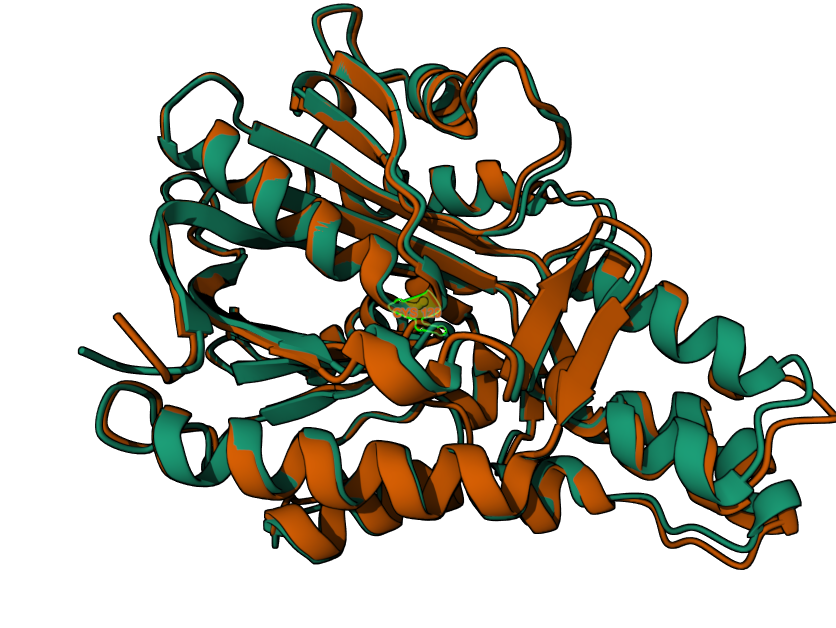

Zooming in on the active site, we see the same Cys-His interaction as the seed sequence's structure (numbered Cys129-His268 in this generated sequence). 

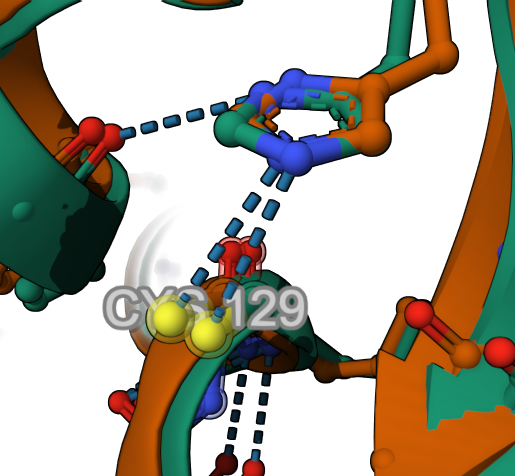

Looking at the full ensemble of 5 models that AlphaFold produced (below), we can see there is overall agreement for both the Cys (yellow) and Histidine (blue) in the generated sequence across predictions, this may suggest there is little uncertainty or flexibility around these residues.

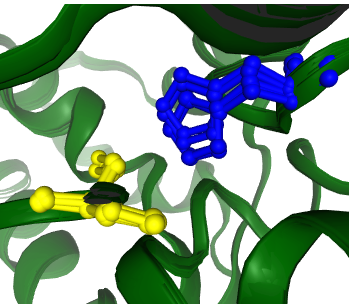

This matches both the *K. sedentarius* and *M. massiliensis* AphaFold predictions. I've reproduced the *M. massiliensis* 5 model ensemble below for illustration:

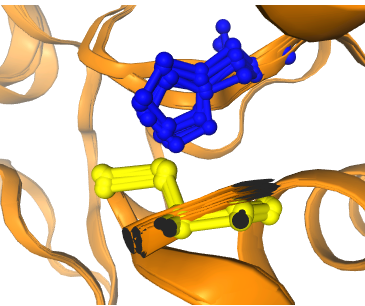

An interesting difference however, is that the His269-Gly301 stabilizing non-covalent interaction in the seed structure has been replaced by a His268-Gln269 interaction in our generated structure:

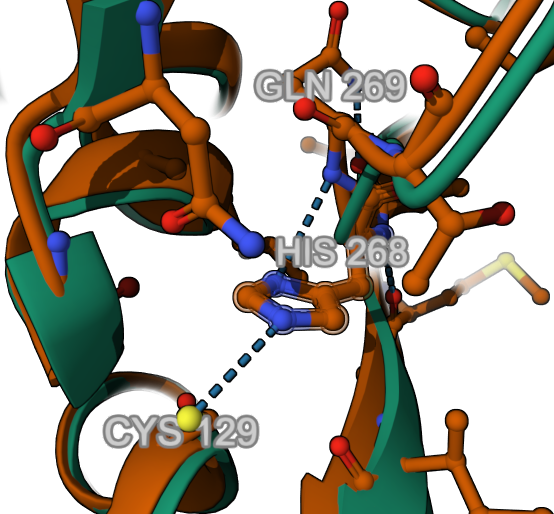

Overall, we can see a high degree of structural similarity, with a few key active site differences. The overall RMSD between the seed and best generated sequence is <1A:

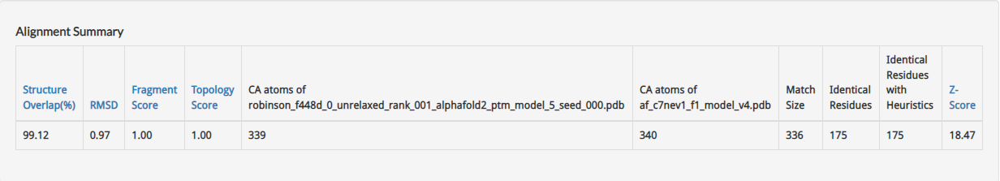

We can also compare this generated sequence to it's closest prompt sequence (which had a 94% sequence identity):

First at the sequence level (below) which shows significant similarity: 

In [52]:
#| code-fold: true
most_similar_prompt_sequence = promptdf.loc[promptdf.name == compared_sim['gen-1'].sort_values().index.tolist()[-1] , 'sequence'].tolist()[0]
aligned = align_report(most_similar_prompt_sequence, best_generated_sequence)

MSENAS-YRLANC-SI-LSVSTV-EAPEVVTSDHLDELLQPAYDT-TGMMAGQIERLAGVRERRWFPKDADYTR-GAVEAGRQAI-ADARIDADRIGLIVNASVTRPHLEPGI-SAMV-HAELELPRSCIAFDVTNACLGVVNSLQIAG-TMIDAGQIEY--ALIVAS-EGARQMQEASIARLV-DGGSRQDVKDAFATMTLGSGAVGIVLGRS-DRHPEGHQ-IIGGITRAGT-EHHELCIGGMDGMRTDAS-KLFVEGLSLATDAWAEAKGEWDWEEMDWYVAHQTSTAHIACLCDTLKLP-A-EKFPVTVDTYGNIGPVALPFTLGMYQH-KMRKGDRVLLMGIGSGLNTSMT-EVRW
|||||  |||||  |  |||||  ||||||||||||||||||||  |||||||||||||||||||||||||||  |||||||||  ||||||||||||||||||||||||||  || | |||||||||||||||||||||||||||||  ||||||||    |||| | ||||||||||||||  ||||||||||||||||||||||||||||  |||||||  |||||||||  |||||||||||||||||  |||||||||||||||||||||||||||||||||||||||||||||||   | ||||||||||||||||||||||||||  |||||||||||||||||||||  ||||
MSENA-TYRLAN-TS-VLSVST-IEAPEVVTSDHLDELLQPAYD-STGMMAGQIERLAGVRERRWFPKDADYT-QGAVEAGRQA-MADARIDADRIGLIVNASVTRPHLEPG-VSA-VVHAELELPRSCIAFDVTNACLGVVNSLQIA-ATMIDAGQI--DNALIV-SSEGARQMQEASIARL-LDGGSRQDVKDAFATMTLGSGAVGIVLGR-ADRHPEGH-RIIGGITRAG-SEHHELCIGGMDGMRTDA-RKLFVEGLSLATDAWAEAKGEWD

In [53]:
#| code-fold: true
start = 250 
stop = 310
print(f"Alignment at ~250-310 region:")
for i in range(3):
    print(aligned.split("\n")[i][start:stop])


Alignment at ~250-310 region:
DAS-KLFVEGLSLATDAWAEAKGEWDWEEMDWYVAHQTSTAHIACLCDTLKLP-A-EKFP
||  |||||||||||||||||||||||||||||||||||||||||||||||   | ||||
DA-RKLFVEGLSLATDAWAEAKGEWDWEEMDWYVAHQTSTAHIACLCDTLK--VAPEKFP


Interestingly, the *M. massiliensis* structure (below, AlphaFold), shows a different hydrogen bonding pattern for His268, despite the sequence conservation (above). The *M. massiliensis* structure lacks any stabilising hydrogen bonding between His268 and adjacent residues. This differs to both the *K. sedentarius* structure (where Gly301 provides support) and the generated sequence above (where Gln269 provides support). Given that the *K. sedentarius* and *M. massiliensis* thiolases were amongst the most active for `butoxy`, there is reason to believe this generated sequence, which borrows from both, would also be highly active against `butoxy`. 

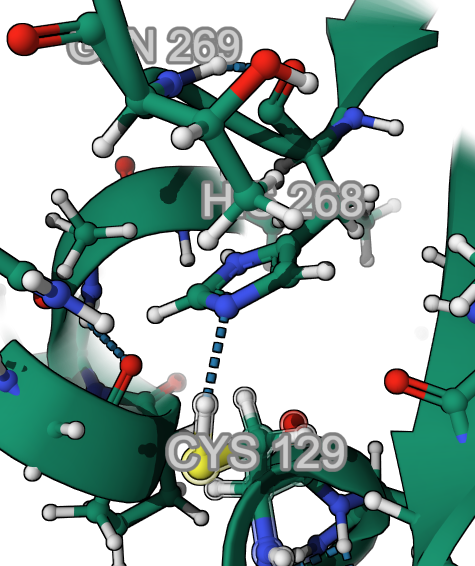

Overall, we can see there is a strong structural similarity between our best scoring generated sequence and both the seed sequence and it's closest prompt sequence; this is reflected in the alignment results, which show a <1A RMSD. Additionally we see strong evidence for conservation at the active site, specifically the Cys-His interaction. Interestingly the stabilising hydrogen bonding pattern differs between all three sequences. And despite the strong sequence similarity between our sequence and *M. massiliensis*, our structure has elements more reminscent of *K. sedentarius* (e.g. the stabilising hydrogen bonding around the active site Histidine). Given these shared elements from two of the best `butoxy` thiolases in our dataset, we would expect this sequence to perform well in any wetlab assay. 

#### Median scoring sequence


Let's now look at the median generated sequence, which has a much lower maximum sequence similarity to any sequence in the prompt (71%). We will follow the same workflow, and look for similar patterns in the active site that might indicate specificity or activity:

First, we can see the overall alignment between this sequence and the seed sequence is good, RMSD is again <1A.


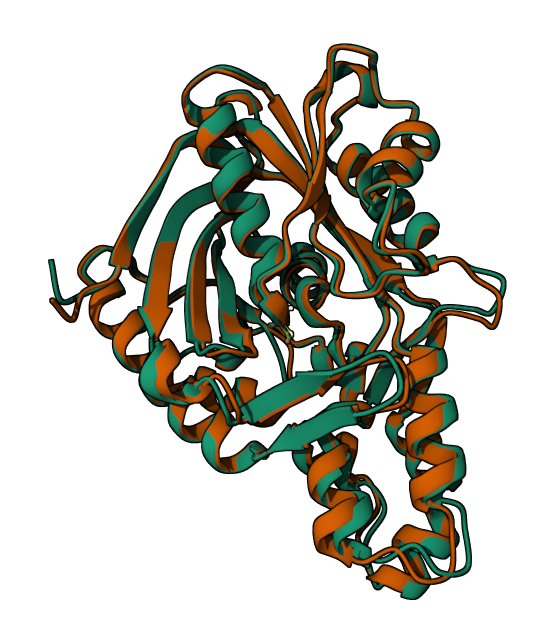

Focussing on the active site (below), we see His269 and Cys129 are conserved again, likely preserving the core "ping-pong" catalytic mechanism. However, the Gln269-His268 interaction that we saw in the best generated sequence, is absent here (reminiscent of *M. massiliensis*). 

There is a Gly301 in the vicinity of the active site Histidine, but this Glycine is distanced from His269, suggesting those stabilizing hydogen bonds we saw in the seed structure will be transient or non-existent here. This may have repercussions for active site volume and solvent accessibility, and therefore activity and specificity (as noted by Robinsin et al. 2020).


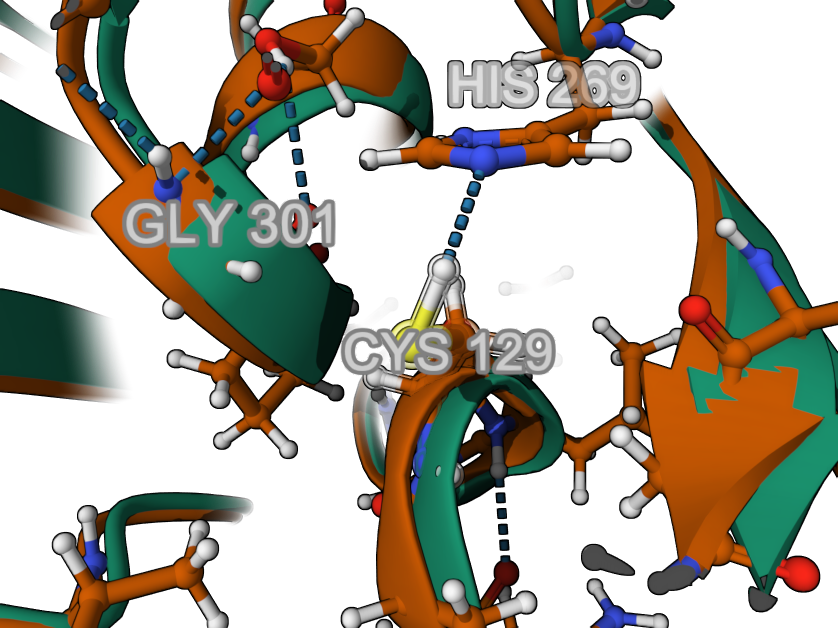

Examining the AlphaFold ensemble of 5 models (below), we see clear agreement on the Cys129 orientation, but less agreement on the positioning of the active site Histidine (blue) than either *K. sedentarius*, *M. massiliensis* or the best generated sequence. This may suggest more flexibility around His269, potentially due to the weaker non-covalent interactions discussed above:

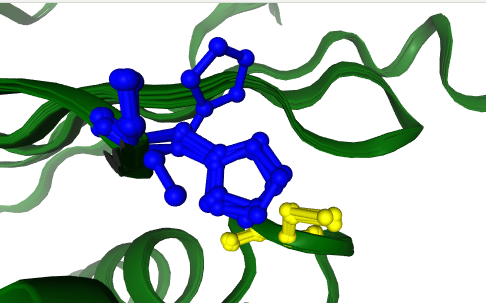

If we examine the sequence similarity between this median generated sequence and it's most similar prompt sequence (below) we see less conservation overall, as expected from its low sequence similarity percentage:

In [54]:
#| code-fold: true
most_similar_prompt_sequence = promptdf.loc[promptdf.name == compared_sim['gen-25'].sort_values().index.tolist()[-1] , 'sequence'].tolist()[0]
aligned = align_report(most_similar_prompt_sequence, median_generated_sequence)

MTG-NAT----YELKDT---AVL-SVCA-VEA--PV-VVTSEAFDERLMRSYE-RT-G--LK----PGMVEQ-L----AGVRE-RRWWP--ED--VTFADA--A-AM--AGAK--ALAEAGV---DPSQVGLLI-NTSVC-RDGIE---PAN--A-AGVHDQ--LGLAT-SCL---NFDVT-NACLGFL-NG-IQ-LAGS--LIDS-G-QVE-YALLV----DAEGL-RGL-QESTLA---RLAQ--DDA-TA-EDLKLQF-A---TLTLGSGSAAM--VL-GR-ASE--HPEG--HR-VTGGVS-RSG--TQHKD--LCWA--DLTQ---MR-TDSRA--LFEA--GIE-L-----AGQTWQ-DALEGREWADA--DWFIAHQTSV-----V-HLQAMAKV--VG-----VPDEKFPKT-V-------P-TF----GNL---ASAAV-PF-TL---AKQVPMIK---PGQQV--ILL--GI-GSGLNTSFA--EII--W
||  |      |        | | ||   | |  |  |||| |  | |    | |  |  ||    |    | |    ||||  ||     |   |   |   | |   ||    ||||||    |  ||| || ||||  |   |   |    | | ||    |||   |     ||||  ||||||  |  |  ||    ||   | ||  || ||    ||    |   ||   |   ||    ||  |  |    || |   ||||||| ||   |  |  |    ||    || | |||  |    |||    ||    |      |  ||  |  |     |   |     |   |  ||   |    |  ||      |      | | |    |  |      |      |  |       | |     ||    ||    |  ||   |      |   ||     | |  |  ||||||  |  |    

Interestingly, we see evidence for strong conservation around the Cys129 residue (see below: the NACL motif is conserved):

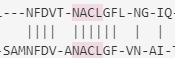

But less conservation around the His269 at the sequence level:

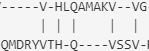

This pattern of conservation (structure and sequence) at the Cys129 position, with non-conservation at the His269 position is likely to have implications for activity. 

Overall, the generate functionality of PoET has yielded a sequence with low identity but high structural fidelity. This median scoring sequence shows only 66% identity to the seed, and 71% to the closest prompt sequence. Despite this low sequence level similarity, the structures are remarkably similar, and the active sites have been preserved very carefully. Furthermore, the changes in secondary support for the active site are likely to effect protein dynamics and activity and warrant further study.

### Generated sequences summary <a class="anchor" id="3_3"></a>

We have generated 50 sequences *de novo* by using an MSA of our `butoxy` catalysing enzyme as a prompt. We previously saw that sequence fitness scored by protsprot correlated well with `butoxy` activity (but not with `dimethyl`, or other compounds). We therefore might expect these novel sequences to show similar activity and specificity against `butoxy`. 

Utilizing AlphaFold, we were able to show that 2 representative sequences (the best, and the median) align with the seed sequence structure to within 1A RMSD, despite having low sequence identity to the seed (50-60%) and, in the case of the median sequence, low identity to *any* prompt sequence (mean: 60%, max: 71%). Furthermore, these generated sequences preserve a vital Cys-His interaction in the active site, but differ in how they stabilize the active site His with surrounding non-covalent interactions. We hypothesize that these secondary differences may influence substrate activity and specificity and warrant further study.

Overall, these sequences (or a subset of them) could be progressed to wetlab evaluation to assess for improved activity over our *K. sedentarius* sequence. This would then generate more data that could be used in OpenProtein's suite of tools to engineer increasingly active and specific thiolases!

# Summary <a class="anchor" id="4_1"></a>

OpenProtein's PoET workflow, a state-of-the-art protein language model, enables the evaluation of protein sequences without functional measurements, leveraging multiple sequence alignment to assess protein fitness and generate novel sequences. 

Using an external thiolase dataset from [Robinson 2020](https://academic.oup.com/synbio/article/5/1/ysaa004/5847618){target="_blank"}, PoET demonstrated a strong correlation between model scores and experimental butoxy catalytic activity. Furthermore, the novel sequences generated in the second half of this demo showed structural similarity to the seed sequence and potential for improved activity, thus offering a powerful tool for protein engineering without preliminary wetlab experiments.

# Appendix <a class="anchor" id="Appendix"></a>


## Additional figures:

### Full results for compound activity vs model score:

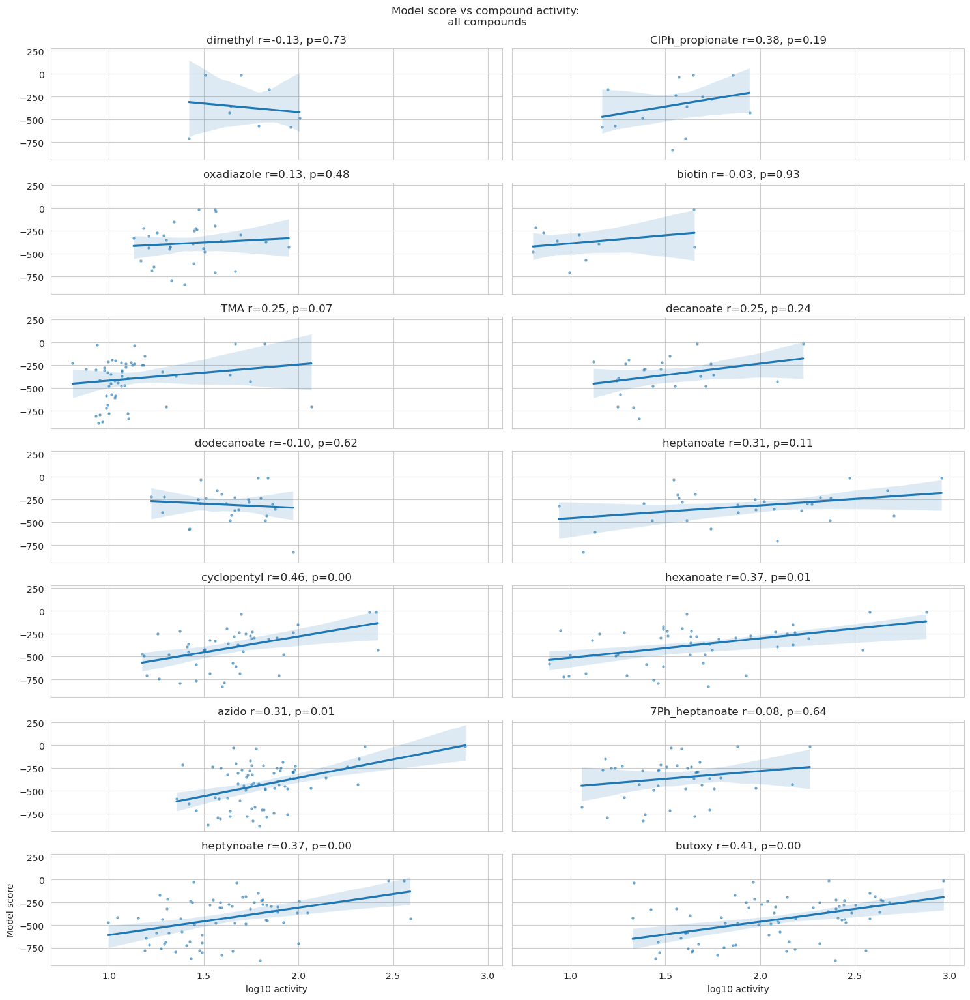

In [55]:
#| code-fold: true
f, axs = plt.subplots(len(compound_correlations)//2, 2,  figsize=(15,15), sharex=True, sharey=True)
axs = axs.flatten()
plt.suptitle("Model score vs compound activity:\n all compounds", y=1.02)
for i, compound in  enumerate(compound_correlations.index.tolist()):
    x = scoring_result.merge(data.query("compound==@compound"), on='sequence')
    x = x.query("mean_log_activity>0")
    r,p = spearmanr(x['score'], x['mean_log_activity'])  
    sns.regplot(data=x,
                x='mean_log_activity',
                y='score',
                scatter_kws={'s': 5, 'alpha': 0.5},
                n_boot=100,
                robust=True,
                ax=axs[i] )
    axs[i] .set_ylabel("")
    axs[i].set_xlabel("")
    # add spearmanr r and p results to graph
    axs[i].set_title(f"{compound} {r=:.2f}, {p=:.2f}");
axs[len(compound_correlations)-2].set_xlabel("log10 activity")
axs[len(compound_correlations)-1].set_xlabel("log10 activity")
axs[len(compound_correlations)-2].set_ylabel("Model score")

plt.tight_layout()

## Additional prompts:

### Scoring with default parameters yields a weaker model: <a class="anchor" id="defaultprompt"></a>

The default prompt settings (as used below) are:

- Use first sequence as seed to generate MSA = `True` (as before)
- number of prompts to ensemble = `1` 
- minimum similarity to seed = `0.0`
- Homology level = `0.8`
- always include seed sequence: `False`
- maximum number of sequences = `0`
- maximum number of amino acids = `12000`  



In [56]:
#| code-fold: true
results_default_prompt = "./results/Robinson2020/prots2prot-query-defaultprompt.csv"

scoring_defaultprompt_job_id = '0d1576e5-f954-453f-ba4e-d5c218701946'
scoring_result_defaultprompt = pd.read_csv(results_default_prompt)
print(f"Reading from {scoring_defaultprompt_job_id}")
scoring_result_defaultprompt.head(3)    

Reading from 0d1576e5-f954-453f-ba4e-d5c218701946


,scores,sequence,score
0,[-497.7345581054688],MRAAQRYDDVVITGLAHVDAPHVVTSTELEDRLAGTLGRLRITPGL...,-497.734558
1,[-329.5821228027344],MNVGITGIAYALPAREVTTAELQRRVAPKLPPRMFEQATGITRRRV...,-329.582123
2,[-232.86839294433597],MDGNATTTHRNVALLSVATTMATRITTSAEIDRRLAPSLKRLKLPT...,-232.868393


Spearman correlation between score and mean_log_activity: 0.26, p=0.03


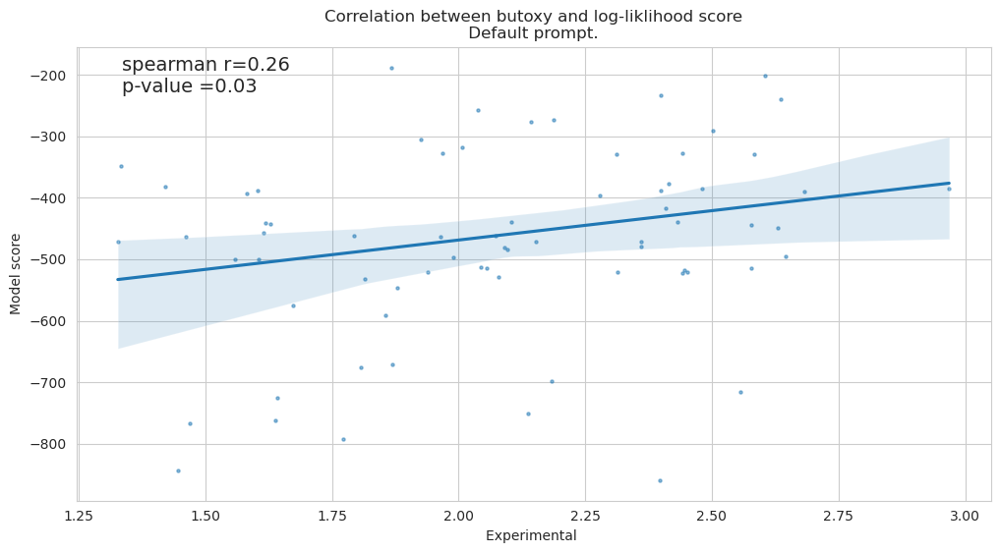

In [57]:
#| code-fold: true
x = scoring_result_defaultprompt.merge(data.query("compound==@selected_compound"), on='sequence')
x = x.query("mean_log_activity>0")
r,p = spearmanr(x['score'], x['mean_log_activity'])
print(f"Spearman correlation between score and mean_log_activity: {r:.2f}, p={p:.2f}")

f, axs = plt.subplots(1,1, figsize=(12,6), sharex=True)
ax = axs
# full results
sns.regplot(data=x,
            x='mean_log_activity',
            y='score',
            scatter_kws={'s': 5, 'alpha': 0.5},
            n_boot=100,
            robust=True,
            ax=ax )
ax .set_xlabel("Experimental ")
ax .set_ylabel("Model score")
# add spearmanr r and p results to graph
ax .text(0.05, 0.9, f"spearman r={r:.2f}\np-value ={p:.2f}", transform=plt.gca().transAxes, size=14);
ax.set_title(f"Correlation between {selected_compound} and log-liklihood score\n Default prompt. ");


In [58]:
#| code-fold: true
response = session.prots2prot.get_prompt(scoring_defaultprompt_job_id, prompt_index=1)
defaultpromptdf = pd.DataFrame(list(response), columns=['name','sequence'])
#rename seed from 101 to uniprotkb entry 
defaultpromptdf.loc[defaultpromptdf.name=='101', 'name'] = 'C7NEV1'
print("Number of sequences in prompt:", len(defaultpromptdf))
print("Sample:")
defaultpromptdf.head(10)

Number of sequences in prompt: 40
Sample:


,name,sequence
0,A0A1F9RVZ1,RYDKVYLAGLGYELAPVVVDTAEIEERLKPALAALRIAEGQIESLT...
1,A0A810ML27,PVGITAVASVLPDREVTTADLQQRVAAASNLPLPPGMFAQATGIDR...
2,A0A354ZDY2,KVMPLFWGYTGSACVPMALAVSRGRIRSGDLVTLVGSGVGYNAGVALL
3,A0A3N1ARH3,VGITGVGVSLPDRTLTTADLQDRVAAASDVVLPPGLFATMTGIGQR...
4,A0A367YQ38,MKTDATYQLNNTAICSAVAVEAPDRVTSAWIDEQLAETYQRLGMTP...
5,A0A1V5NTN6,FSRVFLESIGYELPHNIITSTWIEERLSPLYKKLFLQPGQLEALTG...
6,A0A535XU34,MAGREVKYATRQLTESSLTALREGMSVDDIDQFLFHQANLRIIESV...
7,UPI0003B5A6F3,MNGNATTRHNNVALLAVASTIAPRITTSHEIDQQLAPVLKRLRLPQ...
8,A0A7X8QXU4,RFQKACISSIGYELGPVVVTSDALEARIAPVYKSLGLPLGQLQGLT...
9,A0A0K1PEU7,RWSRVCIEAIAYELPDERVTSSALEARLAPVYEALRLGGGQLEALT...


In [59]:
#| code-fold: true
print(f"Number of overlapping sequences in default args prompt and query: {len(set(unique_sequences) & set(defaultpromptdf.sequence.unique().tolist()))}")
x = [i for i in unique_sequences if i in defaultpromptdf.sequence.unique().tolist()]


Number of overlapping sequences in default args prompt and query: 0


In [60]:
#| code-fold: true
prompt_orgs = [] 
for accnumber in defaultpromptdf.name.unique()[0:]:
    if accnumber == '101':
         continue 
    r = requests.get(f"https://www.uniprot.org/uniprotkb/{accnumber}.json", timeout=3)
    prompt_orgs.append((accnumber, r.json().get('organism', {}).get('scientificName', 'notfound'), r.json().get('organism', {}).get('lineage', [] )))

defaultpromptdf = pd.DataFrame(prompt_orgs, columns=['accnumber', 'organism', 'lineage']).merge(defaultpromptdf, left_on='accnumber', right_on='name')
defaultpromptdf.organism.value_counts()

organism
notfound                                                5
Elusimicrobia bacterium                                 3
Desulfobacteraceae bacterium                            2
Planctomycetota bacterium                               2
Acidobacteria bacterium                                 2
Desulfobulbaceae bacterium BRH_c16a                     1
Opitutae bacterium                                      1
Candidatus Aminicenantes bacterium                      1
Deltaproteobacteria bacterium RIFOXYD12_FULL_57_12      1
Myxococcales bacterium                                  1
Oligosphaeraceae bacterium                              1
Puniceicoccaceae bacterium                              1
Candidatus Wallbacteria bacterium HGW-Wallbacteria-1    1
Roseimaritima ulvae                                     1
Streptomyces lavendulae subsp. lavendulae               1
Acidimicrobiales bacterium                              1
Actinomycetia bacterium                                 1
Elusi

Interestingly, our default prompt contains neither the K. sedentarius or  M. massiliensis sequence. And is drawn from a much larger range of taxonomic orders. This likely is including thiolases other than `butoxy` thiolases. 

In [61]:
#| code-fold: true
defaultpromptdf['seed_similarity'] = [calculate_similarity(msa_seed, s) for s in defaultpromptdf.sequence ]
promptdf['seed_similarity'] = [calculate_similarity(msa_seed, s) for s in promptdf.sequence ]

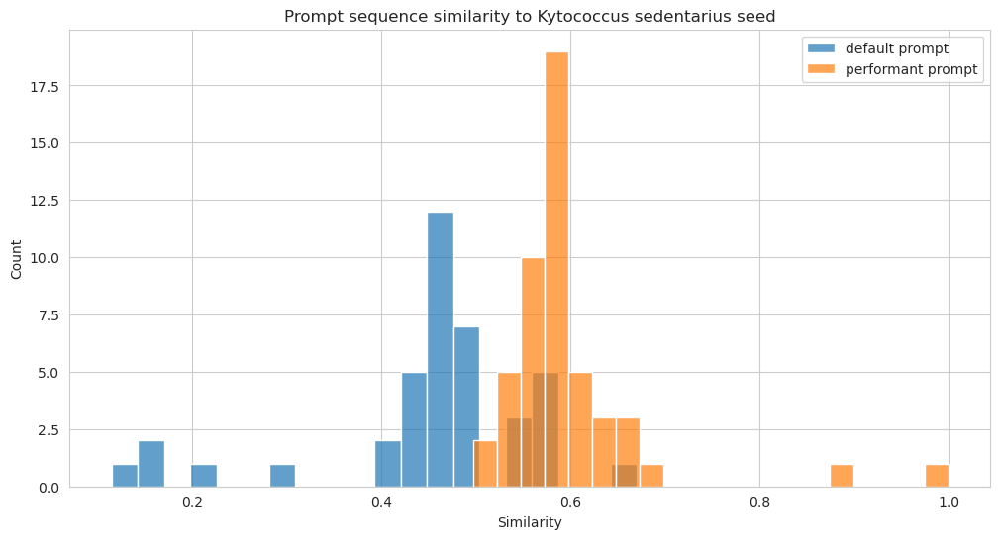

In [62]:
#| code-fold: true
f, ax = plt.subplots(1,1, figsize=(12,6), sharex=True)
sns.histplot(data=defaultpromptdf, x='seed_similarity', bins=20, label='default prompt',alpha=0.7, ax=ax)
sns.histplot(data=promptdf, x='seed_similarity', bins=20, label='performant prompt',alpha=0.7, ax=ax)
plt.legend()
plt.title(f"Prompt sequence similarity to {msa_seed_id} seed")
plt.xlabel(f"Similarity");

We can see above the prompt produced with the default args contains sequences that are far more divergent than our performant prompt used in section 2. This is likely a symptom of the taxonomic diversity and likely the cause of the poor performance with the default prompt.

/opt/conda/envs/py38/lib/python3.8/site-packages/statsmodels/robust/robust_linear_model.py:288: ConvergenceWarning: Estimated scale is 0.0 indicating that the most last iteration produced a perfect fit of the weighted data.
  warnings.warn('Estimated scale is 0.0 indicating that the most'


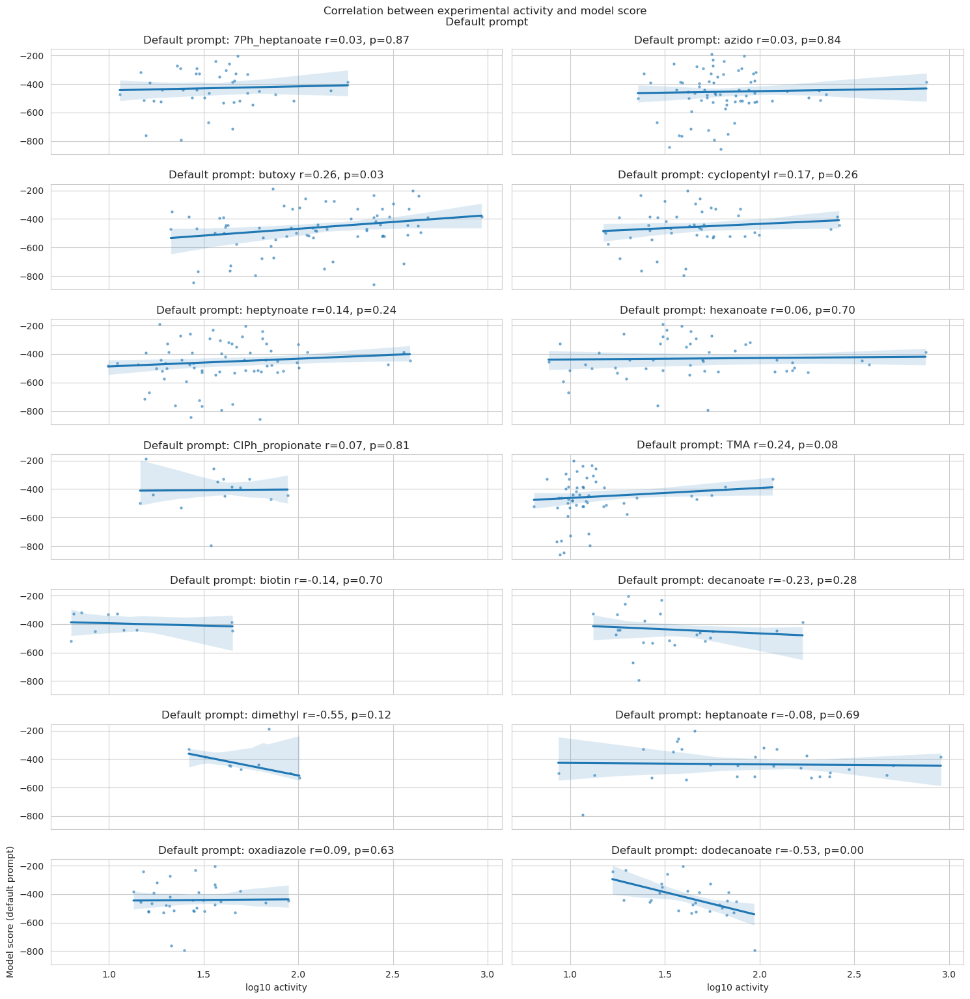

In [63]:
#| code-fold: true
# Full results from default prompt args job
f, axs = plt.subplots(data.compound.nunique()//2, 2,  figsize=(15,15), sharex=True, sharey=True)
axs = axs.flatten()
plt.suptitle("Correlation between experimental activity and model score\n Default prompt", y=1.02)
for i, compound in  enumerate(data.compound.unique()):
    x = scoring_result_defaultprompt.merge(data.query("compound==@compound"), on='sequence')
    x = x.query("mean_log_activity>0")
    r,p = spearmanr(x['score'], x['mean_log_activity'])  
    sns.regplot(data=x,
                x='mean_log_activity',
                y='score',
                scatter_kws={'s': 5, 'alpha': 0.5},
                n_boot=100,
                robust=True,
                ax=axs[i] )
    axs[i] .set_ylabel("")
    axs[i].set_xlabel("")
    # add spearmanr r and p results to graph
    axs[i].set_title(f"Default prompt: {compound} {r=:.2f}, {p=:.2f}");
axs[len(compound_correlations)-2].set_xlabel("log10 activity")
axs[len(compound_correlations)-1].set_xlabel("log10 activity")
axs[len(compound_correlations)-2].set_ylabel("Model score (default prompt)")

plt.tight_layout()